# Required functions from QE_functions for cleaning HMP data and perform DL and ML for X=premenses+menses and Y=post menses BV or not

Number of x_blocks (X): 239
Shape of labels (y): (239,)
Filtered number of x_blocks: 204
Filtered shape of labels (y): (204,)
Number of 1s: 86
Number of 0s: 118
Cross-validation scores: [0.82926829 0.82926829 0.73170732 0.7804878  0.85      ]
Mean cross-validation accuracy: 0.80


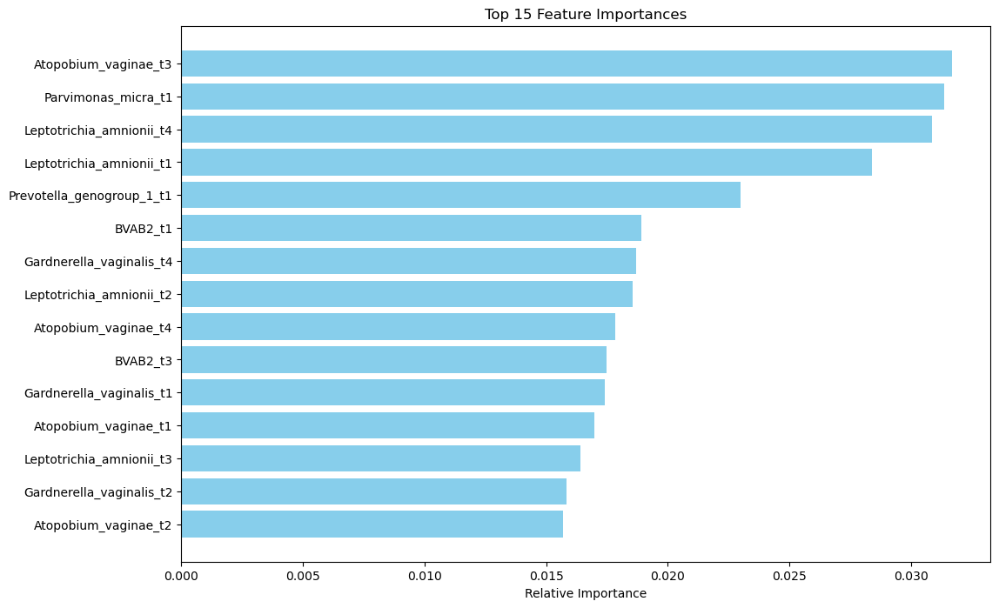

Cross-validated accuracies: [0.7560975609756098, 0.8292682926829268, 0.7560975609756098, 0.7804878048780488, 0.825]
Mean cross-validated accuracy: 0.79
Cross-validated accuracies: [0.8536585365853658, 0.6829268292682927, 0.7317073170731707, 0.7804878048780488, 0.875]
Mean cross-validated accuracy: 0.78
explained variance:  [0.09095611 0.0610989 ]


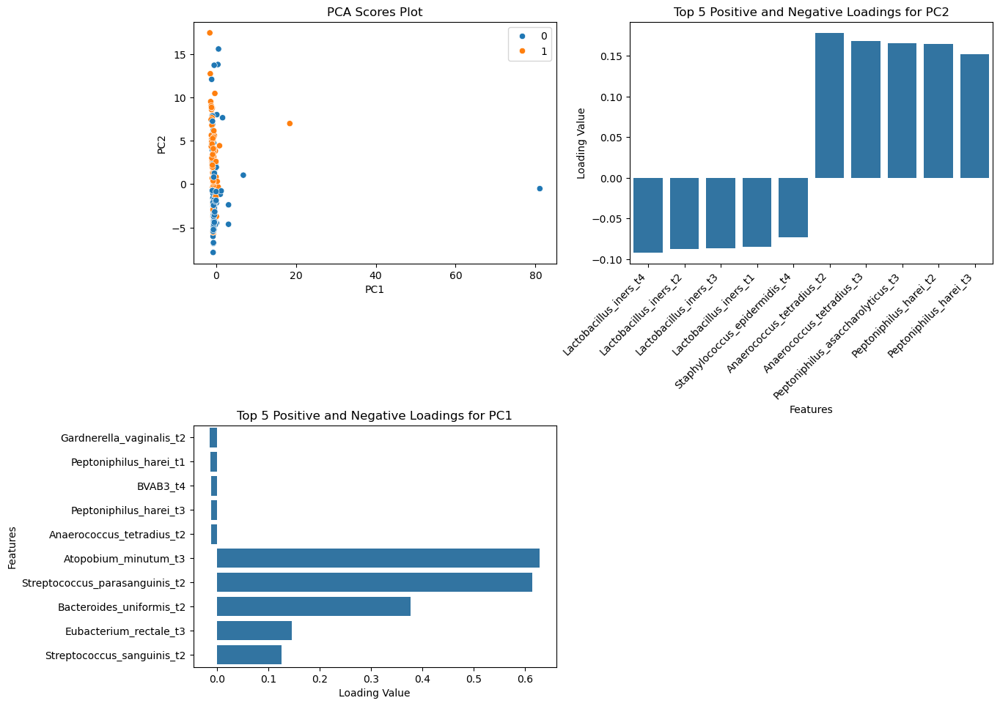

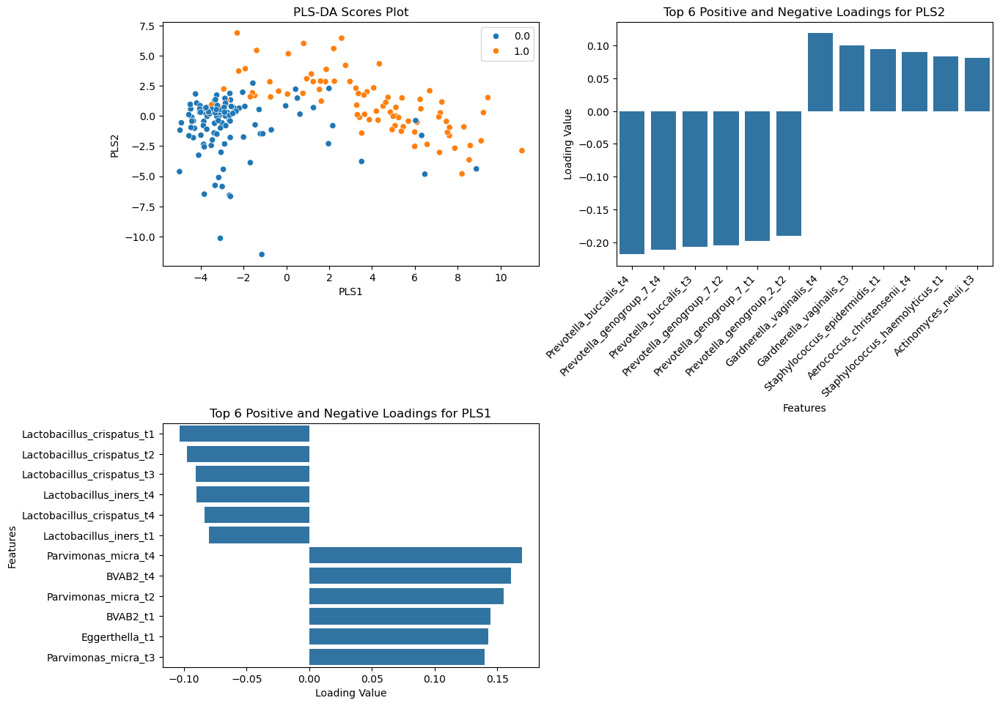

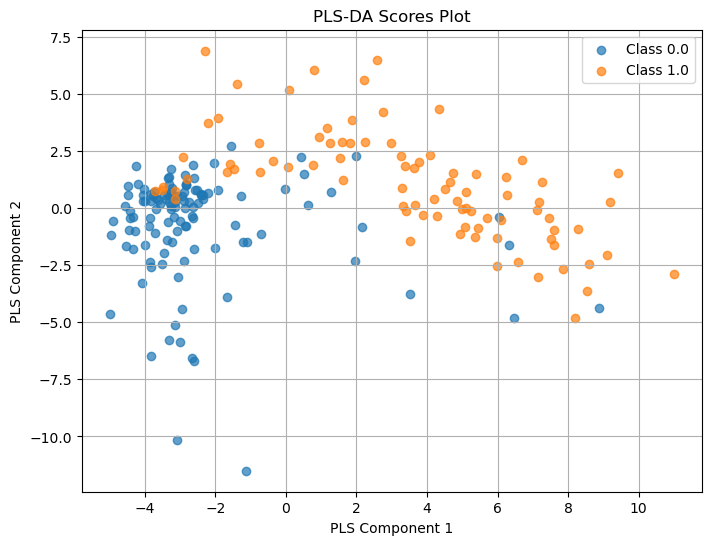

Decision Tree Model: 
Training accuracy per fold: [0.901840490797546, 0.8957055214723927, 0.950920245398773, 0.8957055214723927, 0.926829268292683]
Validation accuracy per fold: [0.7804878048780488, 0.8048780487804879, 0.6341463414634146, 0.6585365853658537, 0.85]
Average training accuracy: 0.91
Average validation accuracy: 0.75


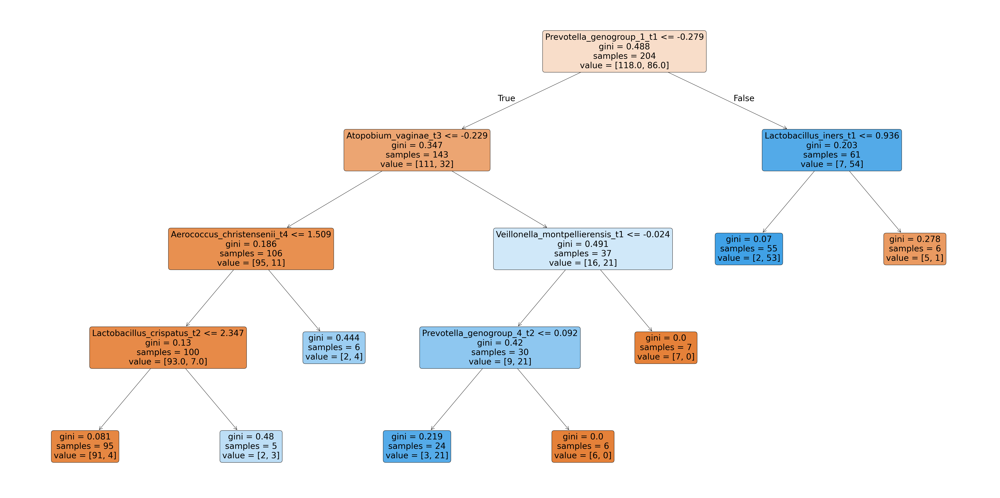

Best parameters found: {'ccp_alpha': 0.0, 'max_depth': 3, 'min_samples_leaf': 2, 'min_samples_split': 10}
Best cross-validation accuracy: 0.80


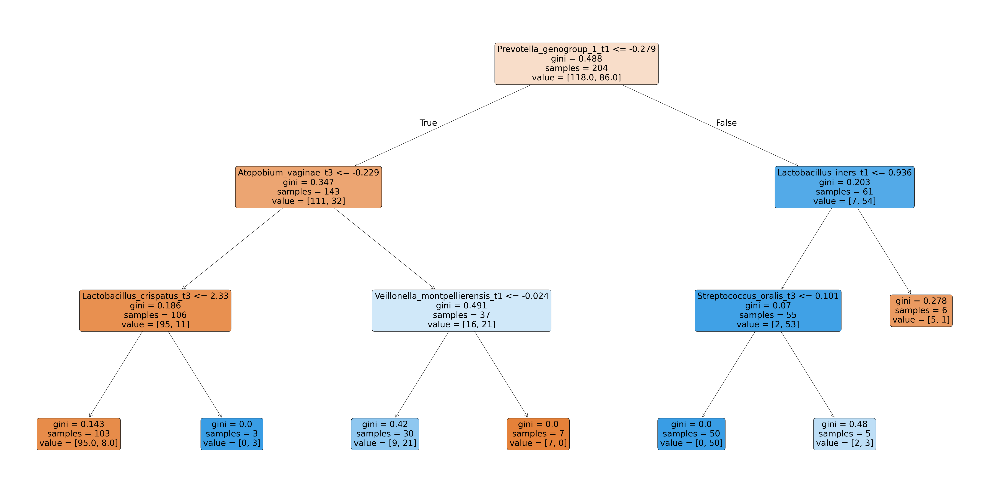

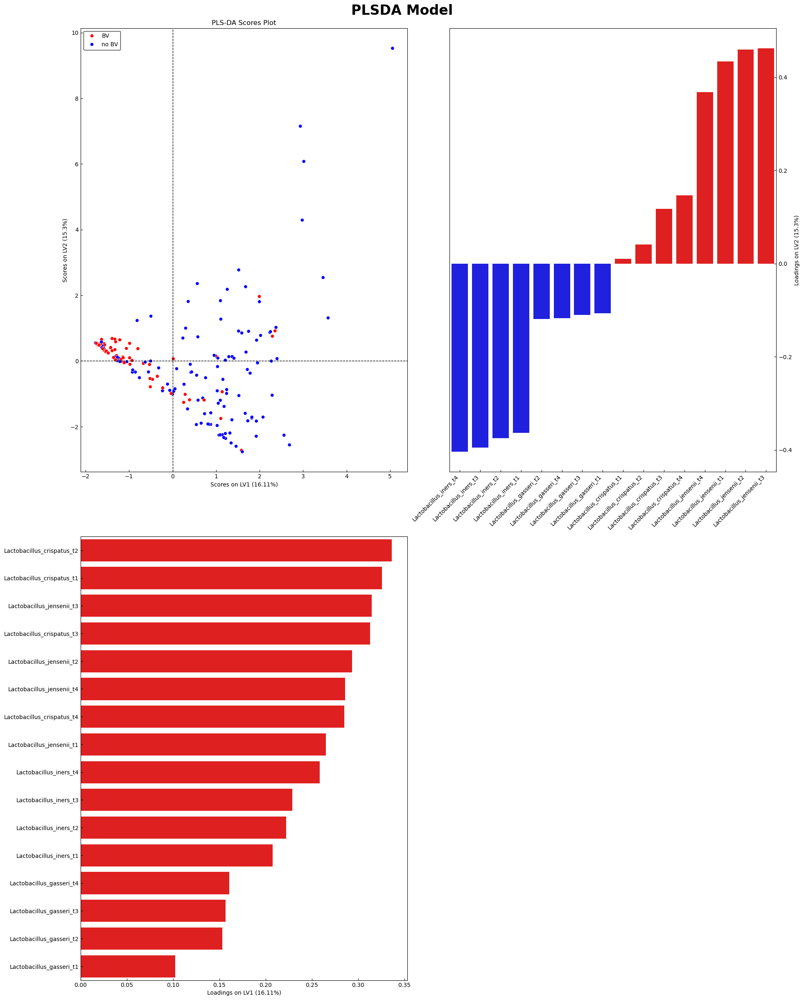

In [1]:
import warnings
# Suppress all warnings globally
warnings.filterwarnings("ignore")
from QE_functions import *
df = df_abundance_nugent(filename=None, log=False, rel_abund=True, zscore=True)
X, y = menstruation_xblock_y_premensesX(df,menses_included=True)
X, y = drop_blocks(X,y,thres=4)
#lstm_model(X,y,padding_value = -1000,n_folds=3)
df = flatten(X)
random_forest_model(df,y)
RForest_top_features_plot(df,y,numb_features=15)
model = plsda_model(df,y)
knn_model(df,y,n_neighbors = 7)
#matlab_ddm_save_data(df,y)
pca_scores_loading(df,y,numb_loadings=5)
df, y = read_df_y()
scores, loadings = plsda_scores_loading(df,y,numb_loadings=6)
all_model_evaluation(df,y,test=True)
plot_plsda_scores(scores, y, title='PLS-DA Scores Plot')
vip_feat, df_vip_values = function_vip(df,y,model,thres=1)
all_model_evaluation(df[vip_feat],y,test=True) #VIP features
train_and_plot_decision_tree(df, y, min_samples_split=5, min_samples_leaf=5, ccp_alpha=0.01, max_depth=4)
train_and_plot_decision_tree_with_grid_search(df, y)
df = get_columns_w_names(df,['Lactobacillus_iners','Lactobacillus_crispatus','Lactobacillus_jensenii','Lactobacillus_gasseri'])
PLSDA_plots(df, y, num_components=2)

# Elastic Network model

In [6]:
#ELASTIC NET FEATURES
df, y = read_df_y(path_df='/Users/bonakdar/Desktop/x_19.csv',
                  path_y='/Users/bonakdar/Desktop/Arnold Lab/QE/HMP/HMP data for MATLAB_Nugent/yblock.csv')

all_model_evaluation(df,y,test=True)

,accuracy,precision,recall,f1,specificity,mse,auc
Random Forest,0.82,0.82,0.74,0.77,0.87,0.18,0.89
Logistic Regression,0.82,0.81,0.74,0.77,0.87,0.18,0.86
Linear SVM,0.84,0.83,0.79,0.80,0.88,0.16,0.82
RBF SVM,0.83,0.79,0.84,0.81,0.83,0.17,0.85
K-Nearest Neighbors,0.76,0.79,0.60,0.68,0.88,0.24,0.80
Gradient Boosting,0.82,0.82,0.75,0.78,0.86,0.18,0.83
PLS-DA,0.83,0.80,0.79,0.79,0.86,0.17,0.85
Random Guess,0.58,0.00,0.00,0.00,1.00,0.42,0.71


# Just use L. spp or BV associated species 
# 2/27/2025

In [3]:
df = get_columns_w_names(df,string='Lactobacillus')
all_model_evaluation(df,y,test=True)

,accuracy,precision,recall,f1,specificity,mse,auc
Random Forest,0.80,0.78,0.73,0.75,0.85,0.20,0.80
Logistic Regression,0.76,0.69,0.75,0.71,0.75,0.24,0.73
Linear SVM,0.76,0.70,0.80,0.74,0.74,0.24,0.67
RBF SVM,0.79,0.75,0.81,0.77,0.78,0.21,0.77
K-Nearest Neighbors,0.76,0.69,0.80,0.74,0.72,0.24,0.78
Gradient Boosting,0.77,0.73,0.74,0.73,0.80,0.23,0.77
PLS-DA,0.81,0.77,0.80,0.78,0.81,0.19,0.81
Random Guess,0.58,0.00,0.00,0.00,1.00,0.42,0.71


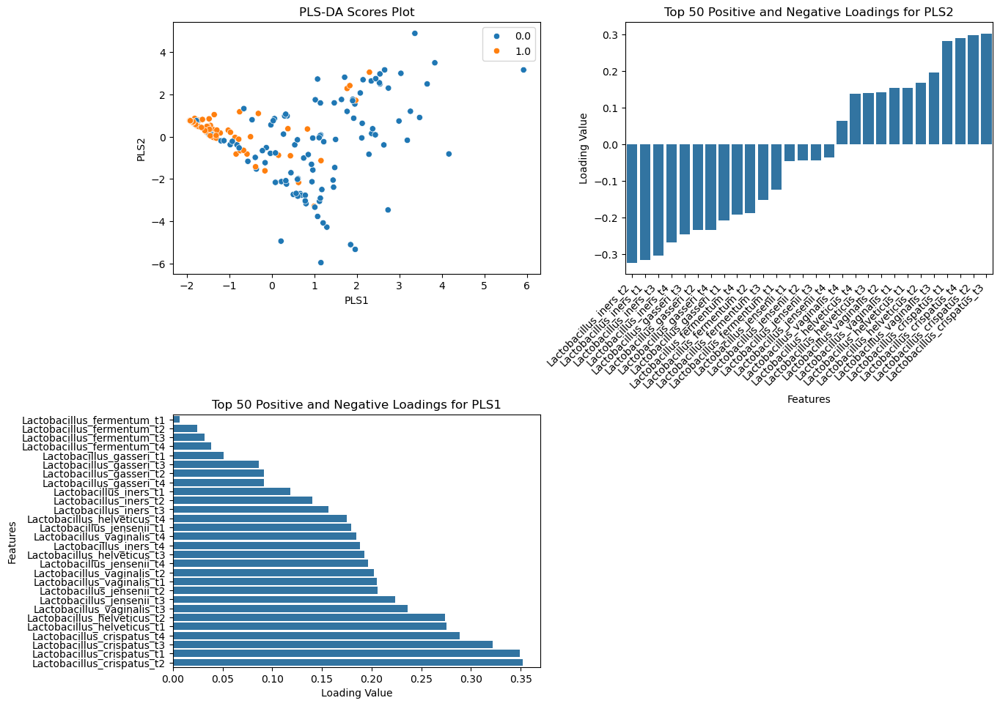

In [6]:
_, _ = plsda_scores_loading(df,y,numb_loadings=50)

Since ML models doesn't understand Nan values we have 2 options here to deal with nan valuse: 

1- Drop all the columns with nan values: This cause the features be from earlier timepoints only

2- Consider only the last timepoints for each sample. e.g. the last 4 days 

3- Imputation of nan values. Since we have many nan values this can bring a bias into system.

I move forward with more realistic way of using only the last timepoints. (option 2)

X and y are ready now. We can design ML models such as RF. 

# Feb 7th 

# PLS-DA VIP score

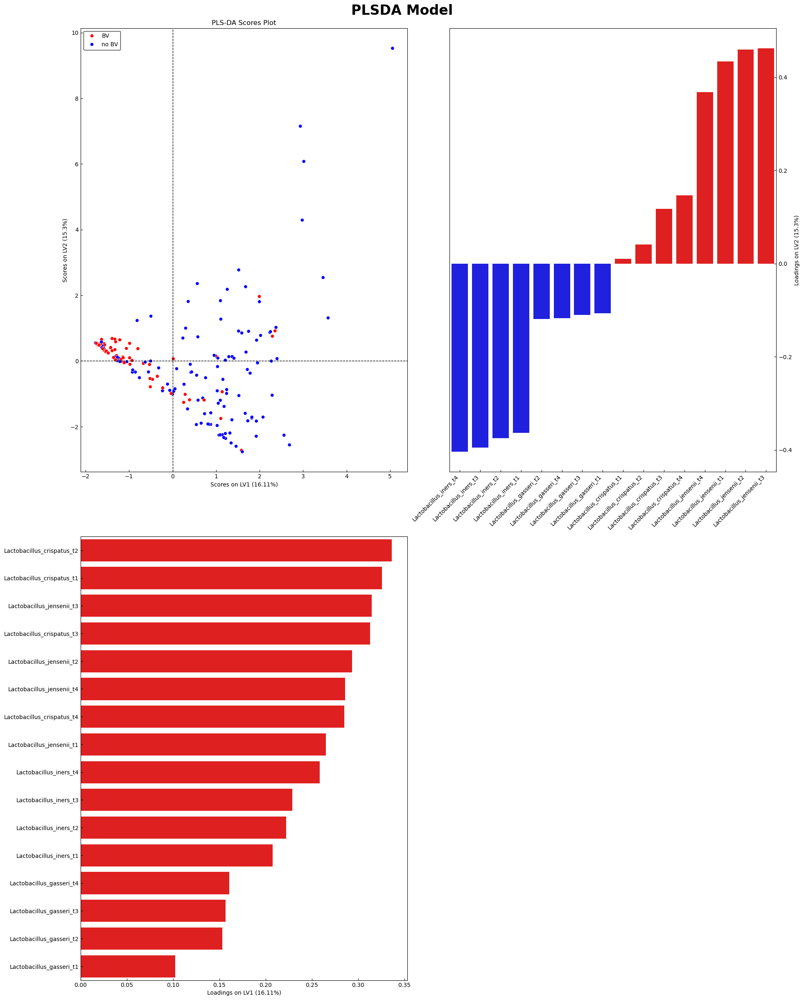

,accuracy,precision,recall,f1,specificity,mse,auc
Random Forest,0.79,0.81,0.67,0.72,0.88,0.21,0.79
Logistic Regression,0.76,0.71,0.77,0.73,0.76,0.24,0.73
Linear SVM,0.78,0.72,0.80,0.75,0.76,0.22,0.69
RBF SVM,0.79,0.74,0.81,0.77,0.77,0.21,0.78
K-Nearest Neighbors,0.78,0.72,0.80,0.75,0.75,0.22,0.78
Gradient Boosting,0.77,0.76,0.71,0.72,0.82,0.23,0.79
PLS-DA,0.79,0.75,0.80,0.76,0.78,0.21,0.76
Random Guess,0.58,0.00,0.00,0.00,1.00,0.42,0.71


In [5]:
#use only iners, crispatus, gasseri, jensenii 
# Correctly filter the columns based on given substrings
df = get_columns_w_names(df,['Lactobacillus_iners','Lactobacillus_crispatus','Lactobacillus_jensenii','Lactobacillus_gasseri'])
PLSDA_plots(df, y, num_components=2)
all_model_evaluation(df,y,test=True)

Checked the results with pls toolbox in matlab. All matched. 

Till here we used Nugent score as the criteria to identify BV or non BV. Since nugent score is a method for measuring gram negative/positive of bacteria it can directly affected by the presence of species in the model. For instance, L. iners associated with non BV which is partially True but if we get more close, L. iners is a gram positive bacteria which can also play role in BV. Same for Atopobium minutum which is a gram positive bacteria but it can also be important in BV. 

Next thing I should try is instead of using Nugent score as the criteria for identifying BV / non BV, I use amsel criteria. 

Sina Bonakdar - 2/28/2025

# Amsel Criteria as output 

either SBV or ABV will be considered as BV. 

In [5]:
import warnings
# Suppress all warnings globally
warnings.filterwarnings("ignore")
from QE_functions import *
df_clinic = create_amsel_label()
df = df_abundance_amsel(df_clinic,filename=None)
X, y = menstruation_xblock_y(df)
X, y = drop_blocks(X,y,thres=4)
#lstm_model(X,y,padding_value = -1000,n_folds=3)


Number of x_blocks (X): 76
Shape of labels (y): (76,)
Filtered number of x_blocks: 65
Filtered shape of labels (y): (65,)
Number of 1s: 17
Number of 0s: 48
Training fold 1...
Epoch 1/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 353ms/step - accuracy: 0.5492 - loss: 1.0730 - val_accuracy: 0.5909 - val_loss: 0.7106
Epoch 2/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step - accuracy: 0.7047 - loss: 0.9556 - val_accuracy: 0.5000 - val_loss: 0.7880
Epoch 3/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step - accuracy: 0.6579 - loss: 0.8567 - val_accuracy: 0.5909 - val_loss: 0.6938
Epoch 4/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step - accuracy: 0.6684 - loss: 0.6792 - val_accuracy: 0.5909 - val_loss: 0.6287
Epoch 5/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step - accuracy: 0.7408 - loss: 0.6621 - val_accuracy: 0.6364 - val_loss: 0.6628
Epoch 6/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step - accuracy: 0.8808 - loss: 0.3623 - val_accuracy: 0.6364 - val_loss: 0.7290
Epoch 7/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step - accuracy: 0.8239 

# Machine learning of amsel 

Cross-validation scores: [0.53846154 0.76923077 0.76923077 0.76923077 0.76923077]
Mean cross-validation accuracy: 0.72


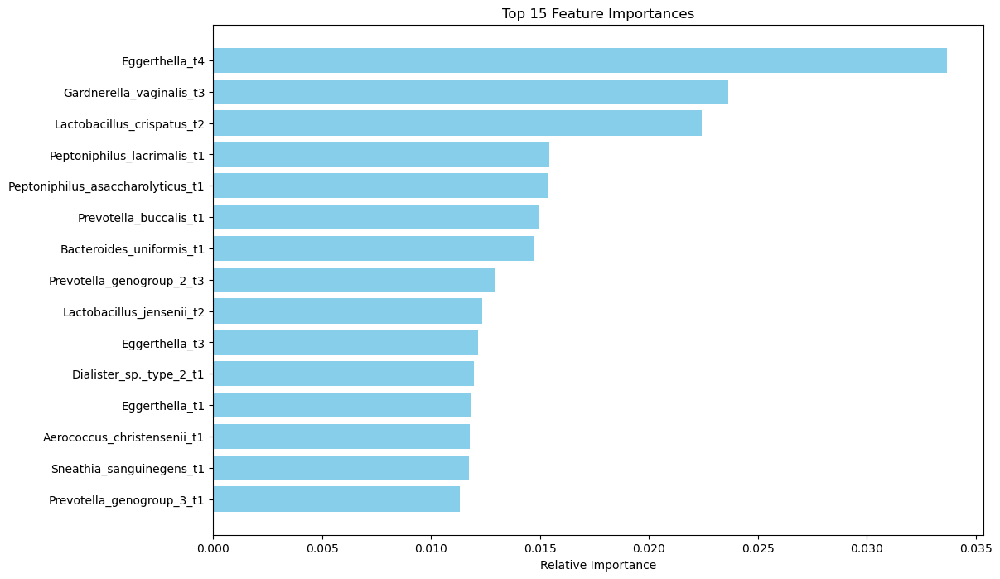

Cross-validated accuracies: [0.6923076923076923, 0.7692307692307693, 0.7692307692307693, 0.7692307692307693, 0.6153846153846154]
Mean cross-validated accuracy: 0.72
Cross-validated accuracies: [0.7692307692307693, 0.7692307692307693, 0.7692307692307693, 0.6923076923076923, 0.6923076923076923]
Mean cross-validated accuracy: 0.74
explained variance:  [0.17234748 0.12607183]


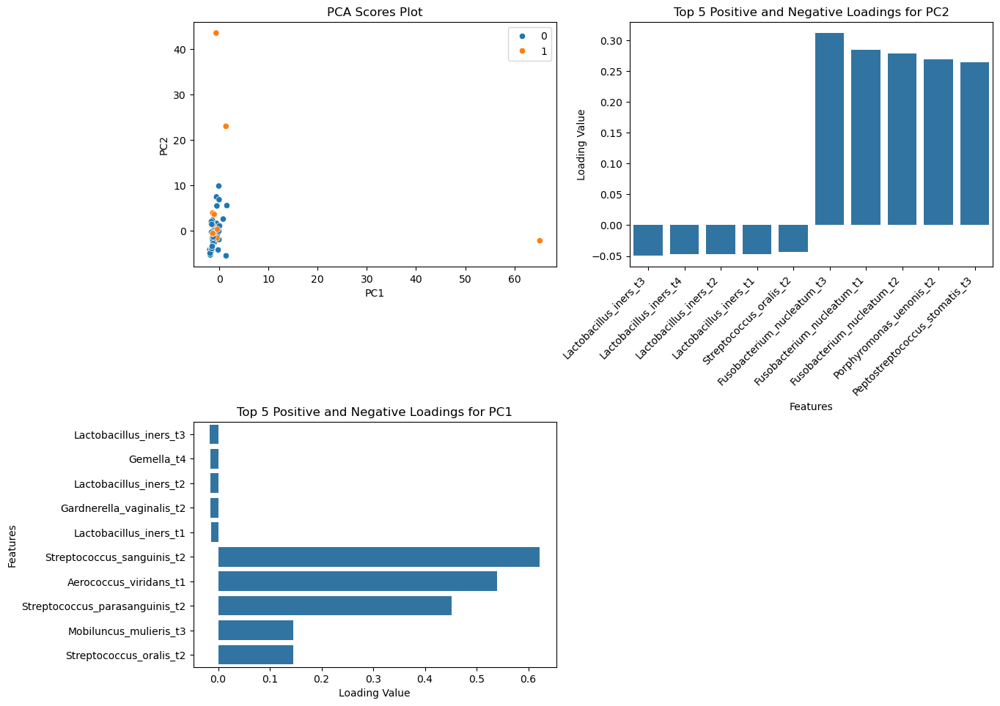

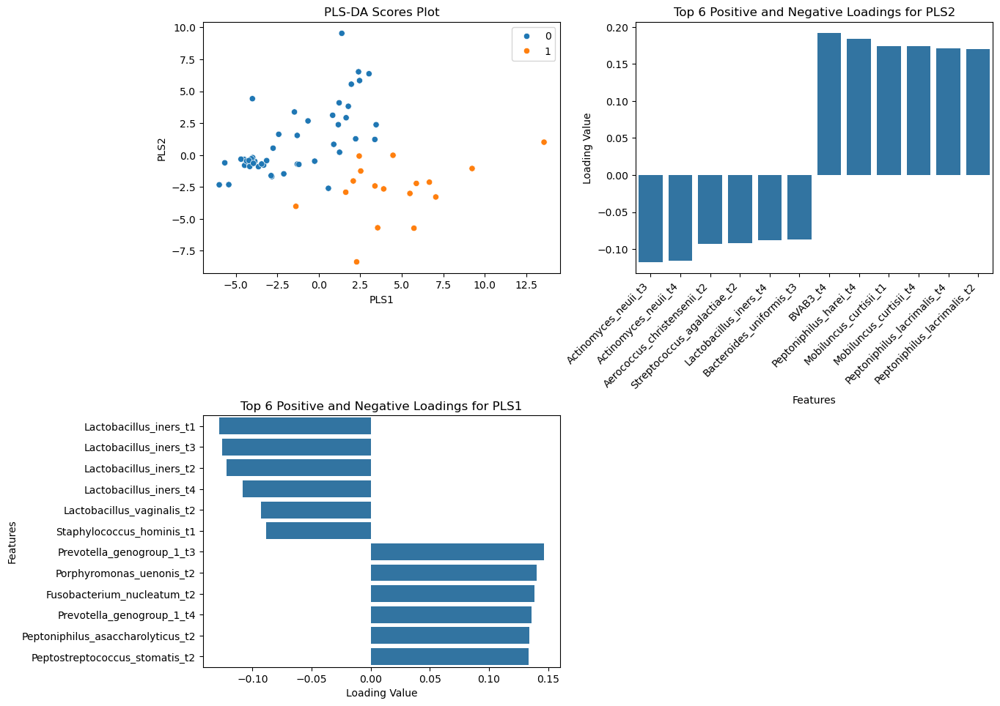

,accuracy,precision,recall,f1,specificity,mse,auc
Random Forest,0.63,0.04,0.07,0.05,0.83,0.37,0.35
Logistic Regression,0.66,0.07,0.13,0.09,0.86,0.34,0.45
Linear SVM,0.66,0.09,0.20,0.12,0.84,0.34,0.25
RBF SVM,0.58,0.14,0.20,0.15,0.73,0.42,0.35
K-Nearest Neighbors,0.72,0.10,0.13,0.11,0.94,0.28,0.40
Gradient Boosting,0.62,0.15,0.20,0.17,0.77,0.38,0.37
PLS-DA,0.72,0.39,0.38,0.31,0.86,0.28,0.48
Random Guess,0.74,0.00,0.00,0.00,1.00,0.26,0.63


In [9]:
df = flatten(X)
random_forest_model(df,y)
RForest_top_features_plot(df,y,numb_features=15)
model = plsda_model(df,y)
knn_model(df,y,n_neighbors = 7)
#matlab_ddm_save_data(df,y)
pca_scores_loading(df,y,numb_loadings=5)
scores, loadings = plsda_scores_loading(df,y,numb_loadings=6)
all_model_evaluation(df,y,test=True)

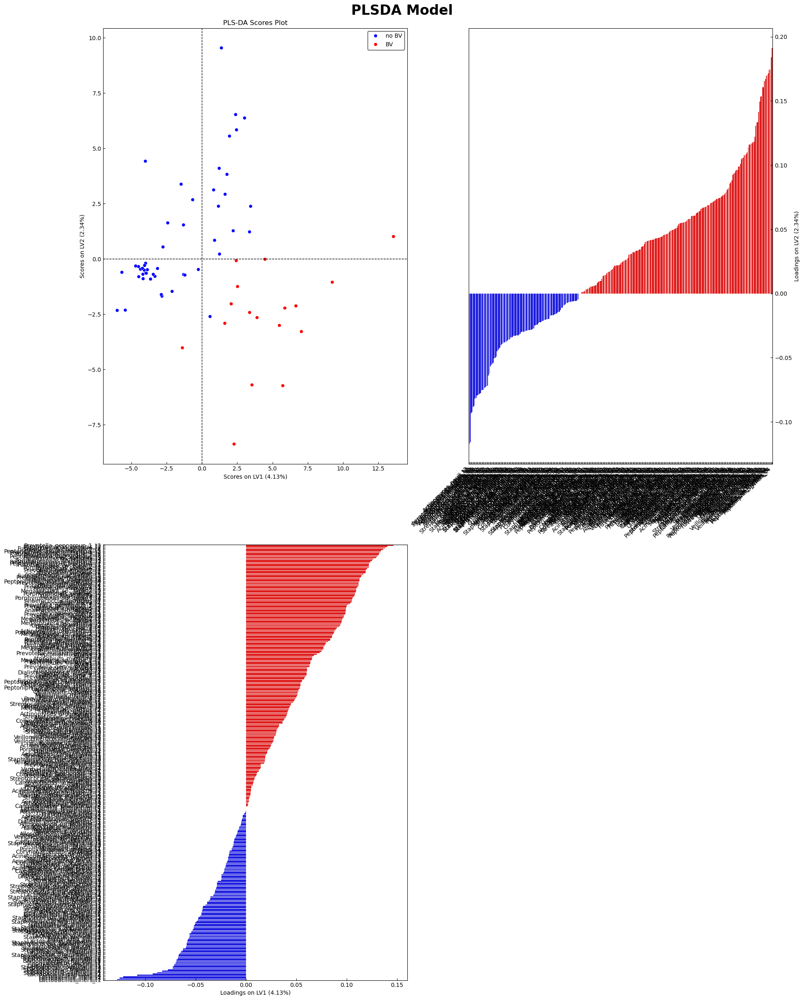

In [10]:
PLSDA_plots(df, y, num_components=2)

# check with VIP and elastic net (amsel)

In [16]:
df, y = read_df_y(path_df='/Users/bonakdar/Desktop/Arnold Lab/QE/HMP/HMP_Amsel_xblock_yblock/xblock_amsel.csv',
                  path_y='/Users/bonakdar/Desktop/Arnold Lab/QE/HMP/HMP_Amsel_xblock_yblock/yblock_amsel.csv')
model = plsda_model(df,y)
vip_feat, df_vip_values = function_vip(df,y,model,thres=1)
all_model_evaluation(df[vip_feat],y,test=True)

Cross-validated accuracies: [0.75, 0.8333333333333334, 0.5, 0.6363636363636364, 0.6363636363636364]
Mean cross-validated accuracy: 0.67


,accuracy,precision,recall,f1,specificity,mse,auc
Random Forest,0.74,0.20,0.07,0.10,0.98,0.26,0.49
Logistic Regression,0.74,0.45,0.20,0.26,0.93,0.26,0.46
Linear SVM,0.74,0.45,0.20,0.26,0.93,0.26,0.29
RBF SVM,0.67,0.40,0.40,0.38,0.77,0.33,0.58
K-Nearest Neighbors,0.76,0.20,0.07,0.10,1.00,0.24,0.48
Gradient Boosting,0.55,0.19,0.27,0.22,0.65,0.45,0.41
PLS-DA,0.81,0.68,0.53,0.58,0.91,0.19,0.73
Random Guess,0.74,0.00,0.00,0.00,1.00,0.26,0.63


In [17]:
#check with only elastic net selected features: 
df, y = read_df_y(path_df='/Users/bonakdar/Desktop/x_3_amsel.csv',
                  path_y='/Users/bonakdar/Desktop/Arnold Lab/QE/HMP/HMP_Amsel_xblock_yblock/yblock_amsel.csv')
model = plsda_model(df,y)
vip_feat, df_vip_values = function_vip(df,y,model,thres=1)
all_model_evaluation(df,y,test=True)

Cross-validated accuracies: [0.75, 0.8333333333333334, 0.75, 0.8181818181818182, 0.7272727272727273]
Mean cross-validated accuracy: 0.78


,accuracy,precision,recall,f1,specificity,mse,auc
Random Forest,0.65,0.25,0.20,0.22,0.81,0.35,0.31
Logistic Regression,0.76,0.30,0.13,0.18,0.98,0.24,0.46
Linear SVM,0.76,0.30,0.13,0.18,0.98,0.24,0.25
RBF SVM,0.79,0.63,0.33,0.41,0.95,0.21,0.60
K-Nearest Neighbors,0.78,0.50,0.20,0.28,0.98,0.22,0.41
Gradient Boosting,0.57,0.11,0.13,0.12,0.72,0.43,0.25
PLS-DA,0.78,0.50,0.20,0.28,0.98,0.22,0.46
Random Guess,0.74,0.00,0.00,0.00,1.00,0.26,0.63


# March 6, 2025: Random Forest feature contributions

In [3]:
import warnings

# Suppress all warnings globally
warnings.filterwarnings("ignore")

In [4]:
import pandas as pd
import numpy as np

df = pd.read_csv('/Users/bonakdar/Desktop/Arnold Lab/QE/HMP/HMP data for MATLAB_Nugent/xblock.csv')
df = df.iloc[:,1:]
y = pd.read_csv('/Users/bonakdar/Desktop/Arnold Lab/QE/HMP/HMP data for MATLAB_Nugent/yblock.csv')
y = y.iloc[:,2:]
y = np.array(y).reshape(-1,)
y.shape


(204,)

In [87]:

from sklearn.ensemble import RandomForestClassifier
clf = RandomForestClassifier(n_estimators=10, random_state=42, max_depth=4)
clf.fit(df, y)
#Access the first tree in the forest
first_tree = clf.estimators_[9].tree_
first_tree
feature_names = df.columns
def print_tree_structure(tree, feature_names, node=0, depth=0):
    indent = "  " * depth
    if tree.children_left[node] == -1:
        # If it's a leaf node
        print(f"{indent}Leaf node: {tree.value[node]}")
    else:
        # If it's an internal node
        feature = feature_names[tree.feature[node]]
        threshold = tree.threshold[node]
        print(f"{indent}Node: If ({feature} <= {threshold})")
        print(f"{indent}Left child of node {node}:")
        print_tree_structure(tree, feature_names, tree.children_left[node], depth + 1)
        print(f"{indent}Right child of node {node}:")
        print_tree_structure(tree, feature_names, tree.children_right[node], depth + 1)

# Print the detailed structure of the first tree
print_tree_structure(first_tree, feature_names)

Node: If (Atopobium_vaginae_t3 <= -0.3066280782222748)
Left child of node 0:
  Node: If (Lactobacillus_crispatus_t2 <= 2.3469691276550293)
  Left child of node 1:
    Node: If (Leptotrichia_amnionii_t1 <= -0.1988162249326706)
    Left child of node 2:
      Node: If (BVAB3_t4 <= -0.20162687450647354)
      Left child of node 3:
        Leaf node: [[0.95505618 0.04494382]]
      Right child of node 3:
        Leaf node: [[0.5 0.5]]
    Right child of node 2:
      Node: If (Porphyromonas_uenonis_t3 <= -0.1462537944316864)
      Left child of node 6:
        Leaf node: [[1. 0.]]
      Right child of node 6:
        Leaf node: [[0. 1.]]
  Right child of node 1:
    Node: If (Lactobacillus_vaginalis_t3 <= 0.7687620371580124)
    Left child of node 9:
      Leaf node: [[0. 1.]]
    Right child of node 9:
      Leaf node: [[1. 0.]]
Right child of node 0:
  Node: If (Porphyromonas_uenonis_t3 <= -0.1431862637400627)
  Left child of node 12:
    Node: If (Gardnerella_vaginalis_t4 <= 0.409556701

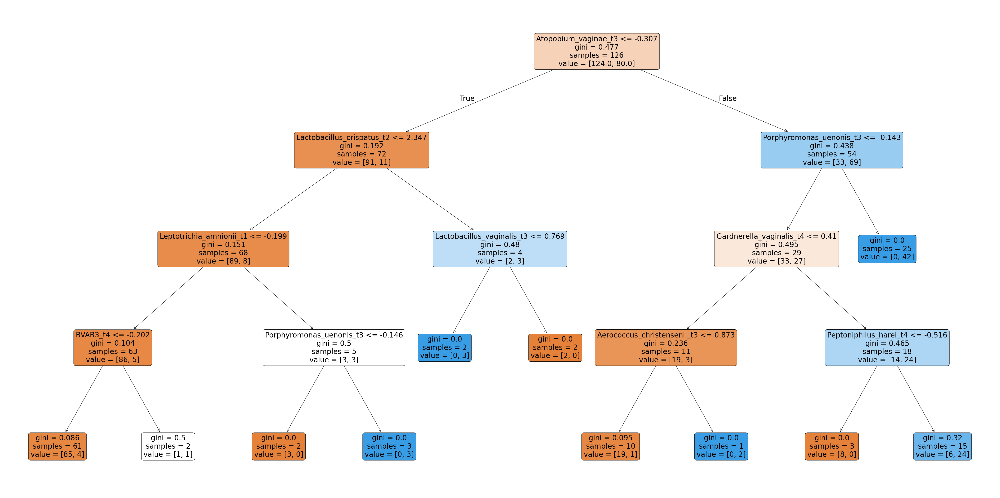

In [50]:
from sklearn.tree import plot_tree
first_tree = clf.estimators_[9]
plt.figure(figsize=(60, 30))
plot_tree(first_tree, filled=True, feature_names=df.columns, rounded=True, fontsize=24)
plt.show()

Best Tree Index: 77
Best Overall Accuracy: 0.9167


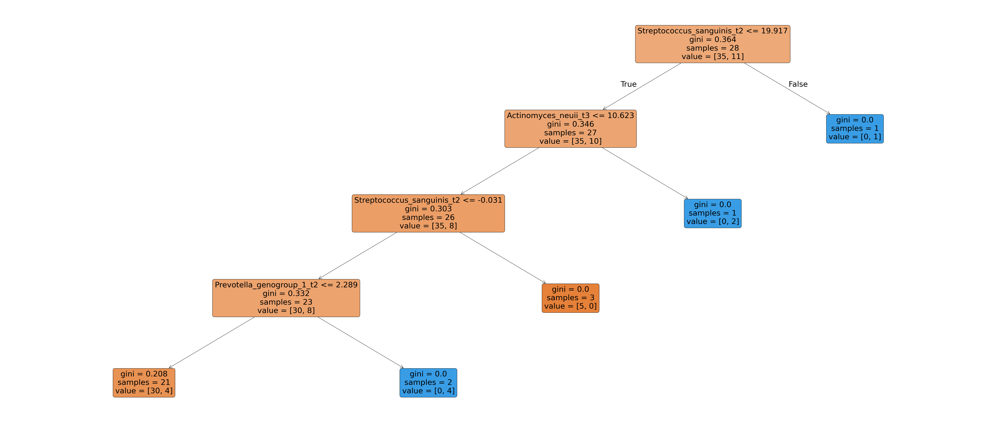

In [20]:
from sklearn.datasets import load_iris
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import StratifiedKFold, train_test_split
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree


# Set up the stratified 5-fold cross-validation
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

best_accuracy_overall = 0
best_tree_overall = None

for train_index, test_index in skf.split(df, y):
    X_train, X_test = df.iloc[train_index], df.iloc[test_index]
    y_train, y_test = y[train_index], y[test_index]

    # Train the random forest classifier
    clf = RandomForestClassifier(n_estimators=100, random_state=0, max_depth=4)
    clf.fit(X_train, y_train)

    # Evaluate each tree in the random forest for this fold
    for i, tree in enumerate(clf.estimators_):
        # Predict using the individual tree
        tree_predictions = tree.predict(X_test)

        # Calculate accuracy
        accuracy = accuracy_score(y_test, tree_predictions)

        # Update the best tree if this one is better
        if accuracy > best_accuracy_overall:
            best_accuracy_overall = accuracy
            best_tree_overall = i  # Capture the index of the best tree
            best_tree_model = tree

# Output the overall best-performing tree
print(f"Best Tree Index: {best_tree_overall}")
print(f"Best Overall Accuracy: {best_accuracy_overall:.4f}")

# Plot the best tree
plt.figure(figsize=(70, 30))
plot_tree(best_tree_model, filled=True, feature_names=df.columns, rounded=True, fontsize=30)
plt.show()

Accuracies from each fold using the best tree:
Fold 1: 0.7500
Fold 2: 0.9167
Fold 3: 0.7500
Fold 4: 0.8182
Fold 5: 0.9091


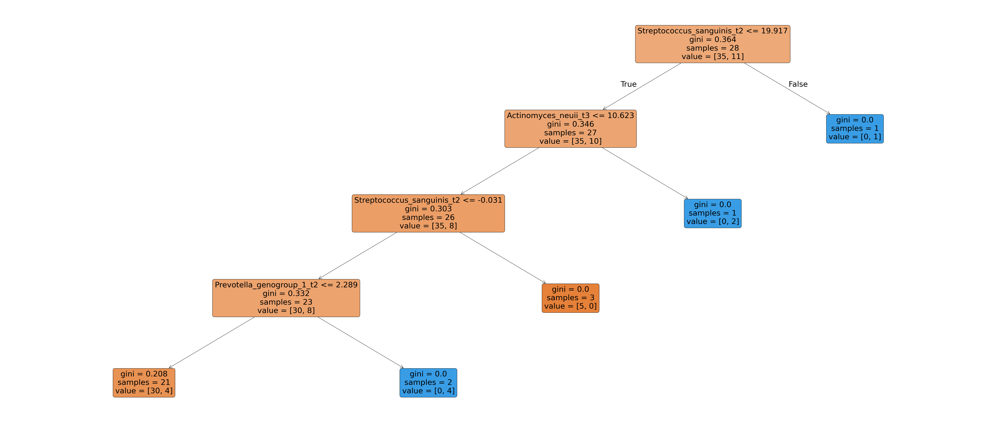

In [21]:
# Now evaluate the best tree over 5 folds
accuracies = []

for train_index, test_index in skf.split(df, y):
    X_train, X_test = df.iloc[train_index], df.iloc[test_index]
    y_train, y_test = y[train_index], y[test_index]

    # Predict using the best tree
    tree_predictions = best_tree_model.predict(X_test)
    accuracy = accuracy_score(y_test, tree_predictions)
    accuracies.append(accuracy)

# Print accuracies from each fold
print("Accuracies from each fold using the best tree:")
for fold_idx, acc in enumerate(accuracies, 1):
    print(f"Fold {fold_idx}: {acc:.4f}")

# Plot the best tree
plt.figure(figsize=(70, 30))
plot_tree(best_tree_model, filled=True, feature_names=df.columns, rounded=True, fontsize=30)
plt.show()

# March 10, 2025: Just use premenses data to predict post menses

X will be premenses, label will be identified from post menses 

In [1]:
import warnings
# Suppress all warnings globally
warnings.filterwarnings("ignore")
from QE_functions import *
df = df_abundance_nugent(filename=None, log=False, rel_abund=True, zscore=True)
X, y = menstruation_xblock_y_premensesX(df) #X=premenses data
X, y = drop_blocks(X,y,thres=4)
#lstm_model(X,y,padding_value = -1000,n_folds=5)

relative abundance + zscore data
Number of x_blocks (X): 239
Shape of labels (y): (239,)
Filtered number of x_blocks: 171
Filtered shape of labels (y): (171,)
Number of 1s: 69
Number of 0s: 102


In 5 folds CV: avg = 0.86

# ML

In [3]:
df = flatten(X)
#random_forest_model(df,y)
#Forest_top_features_plot(df,y,numb_features=15)
#scores, loadings = plsda_scores_loading(df,y,numb_loadings=6)
all_model_evaluation(df,y,test=True)

,accuracy,precision,recall,f1,specificity,mse,auc
Random Forest,0.81,0.81,0.71,0.75,0.87,0.19,0.85
Logistic Regression,0.78,0.75,0.68,0.71,0.84,0.22,0.77
Linear SVM,0.72,0.67,0.62,0.64,0.78,0.28,0.68
RBF SVM,0.80,0.82,0.68,0.73,0.88,0.20,0.77
K-Nearest Neighbors,0.74,0.82,0.48,0.59,0.91,0.26,0.75
Gradient Boosting,0.81,0.80,0.74,0.76,0.86,0.19,0.76
PLS-DA,0.77,0.74,0.68,0.70,0.83,0.23,0.71
Random Guess,0.60,0.00,0.00,0.00,1.00,0.40,0.70


In [6]:
#VIP features
model = plsda_model(df,y)
vip_feat, df_vip_values = function_vip(df,y,model,thres=1)
print('using only vip features:')
all_model_evaluation(df[vip_feat],y,test=True) #VIP features

Cross-validated accuracies: [0.7714285714285715, 0.7352941176470589, 0.7647058823529411, 0.8235294117647058, 0.7352941176470589]
Mean cross-validated accuracy: 0.77
using only vip features:


,accuracy,precision,recall,f1,specificity,mse,auc
Random Forest,0.83,0.81,0.78,0.79,0.86,0.17,0.76
Logistic Regression,0.80,0.78,0.71,0.74,0.86,0.20,0.80
Linear SVM,0.79,0.78,0.66,0.72,0.87,0.21,0.76
RBF SVM,0.82,0.80,0.77,0.78,0.86,0.18,0.80
K-Nearest Neighbors,0.74,0.77,0.52,0.61,0.88,0.26,0.79
Gradient Boosting,0.84,0.82,0.77,0.79,0.88,0.16,0.78
PLS-DA,0.84,0.85,0.77,0.80,0.89,0.16,0.84
Random Guess,0.60,0.00,0.00,0.00,1.00,0.40,0.70


# Just use premenses data to predict post menses, X = log transformed data


In [9]:
import warnings
# Suppress all warnings globally
warnings.filterwarnings("ignore")
from QE_functions import *
df = df_abundance_nugent(filename=None, log=True, rel_abund=False, zscore=False)
X, y = menstruation_xblock_y_premensesX(df) #X=premenses data
X, y = drop_blocks(X,y,thres=4)
lstm_model(X,y,padding_value = -1000,n_folds=5)

log transformed data
Number of x_blocks (X): 239
Shape of labels (y): (239,)
Filtered number of x_blocks: 171
Filtered shape of labels (y): (171,)
Number of 1s: 69
Number of 0s: 102
Training fold 1...
Epoch 1/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 3s 231ms/step - accuracy: 0.6202 - loss: 1.0204 - val_accuracy: 0.8286 - val_loss: 0.5287
Epoch 2/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 152ms/step - accuracy: 0.7780 - loss: 0.5850 - val_accuracy: 0.8286 - val_loss: 0.5310
Epoch 3/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 148ms/step - accuracy: 0.7920 - loss: 0.5449 - val_accuracy: 0.8571 - val_loss: 0.4856
Epoch 4/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - accuracy: 0.9133 - loss: 0.2425 - val_accuracy: 0.8286 - val_loss: 0.5104
Epoch 5/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - accuracy: 0.8406 - loss: 0.4094 - val_accuracy: 0.8000 - val_loss: 0.6057
Epoch 6/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 154ms/step - accuracy: 0.8396 - loss: 0.3389 - val_accuracy: 0.8286 - val_loss: 0.5192
Epoch 7/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 158m

Cross-validation scores: [0.82857143 0.79411765 0.91176471 0.85294118 0.73529412]
Mean cross-validation accuracy: 0.82


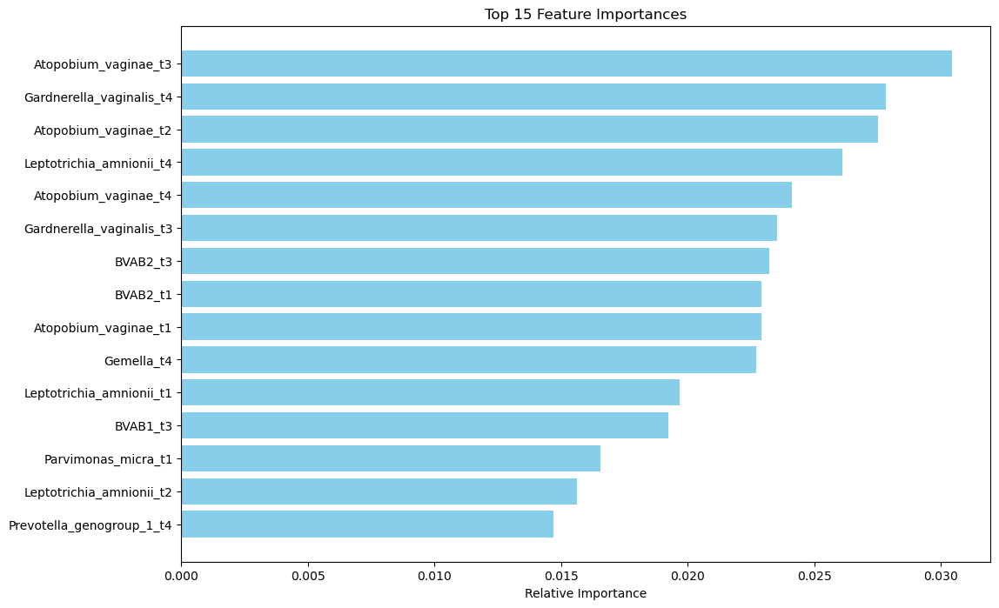

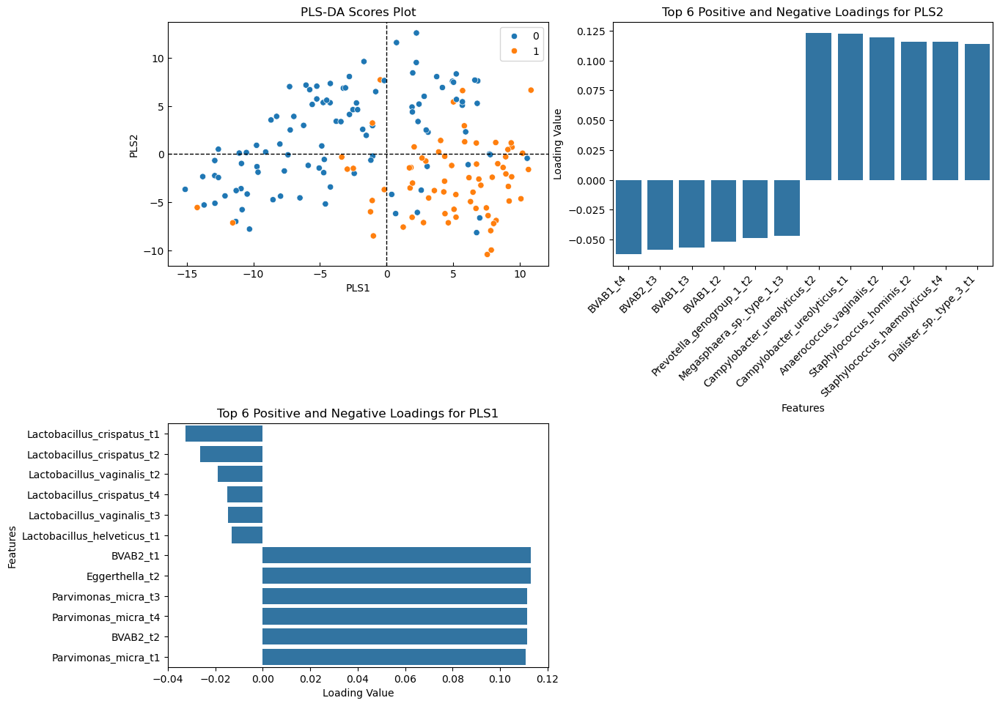

,accuracy,precision,recall,f1,specificity,mse,auc
Random Forest,0.82,0.82,0.73,0.76,0.88,0.18,0.80
Logistic Regression,0.74,0.69,0.68,0.68,0.78,0.26,0.72
Linear SVM,0.70,0.64,0.64,0.63,0.74,0.30,0.70
RBF SVM,0.82,0.76,0.84,0.79,0.82,0.18,0.81
K-Nearest Neighbors,0.82,0.81,0.73,0.76,0.88,0.18,0.74
Gradient Boosting,0.79,0.76,0.74,0.73,0.83,0.21,0.77
PLS-DA,0.82,0.80,0.75,0.78,0.87,0.18,0.80
Random Guess,0.60,0.00,0.00,0.00,1.00,0.40,0.70


In [10]:
df = flatten(X)
random_forest_model(df,y)
RForest_top_features_plot(df,y,numb_features=15)
scores, loadings = plsda_scores_loading(df,y,numb_loadings=6)
all_model_evaluation(df,y,test=True)

# March, 10, 2025: Just look at women in CST-III and who's switching to BV (Nugent)

In [9]:
import warnings
# Suppress all warnings globally
warnings.filterwarnings("ignore")
from QE_functions import *
df = df_abundance_nugent(filename=None, log=True, rel_abund=False, zscore=False,cst=True)
X, y = menstruation_xblock_y_premensesX(df) #X=premenses data
X, y = drop_blocks(X,y,thres=4)
(X_1, y_1), (X_2, y_2), (X_3, y_3), (X_4, y_4), (X_5, y_5) = split_blocks_by_CST_most_frequent(X, y)
#lstm_model(X_3,y_3,padding_value = -1000,n_folds=3)

log transformed data
Number of x_blocks (X): 205
Shape of labels (y): (205,)
Filtered number of x_blocks: 146
Filtered shape of labels (y): (146,)
Number of 1s: 59
Number of 0s: 87
cst counts:  CST_HL
1.0    20
3.0     1
Name: count, dtype: int64
cst counts:  CST_HL
4.0    3
3.0    3
Name: count, dtype: int64
cst counts:  CST_HL
4.0    23
Name: count, dtype: int64
cst counts:  CST_HL
3.0    13
4.0     6
1.0     1
Name: count, dtype: int64
cst counts:  CST_HL
4.0    13
3.0    11
Name: count, dtype: int64
cst counts:  CST_HL
4.0    8
3.0    6
Name: count, dtype: int64
cst counts:  CST_HL
3.0    15
2.0     4
4.0     4
Name: count, dtype: int64
cst counts:  CST_HL
4.0    2
3.0    2
Name: count, dtype: int64
cst counts:  CST_HL
3.0    12
2.0    10
4.0     4
5.0     1
Name: count, dtype: int64
cst counts:  CST_HL
3.0    12
4.0     2
Name: count, dtype: int64
cst counts:  CST_HL
4.0    5
2.0    3
3.0    2
Name: count, dtype: int64
cst counts:  CST_HL
2.0    4
3.0    2
4.0    1
Name: count, dt

In [20]:
for i in range(len(lst_y)):
    print('number of samples in CST{}: {}'.format(i+1,len(lst_y[i])))
    print('number of cases get BV post menses ',sum(lst_y[i]==1))

number of samples in CST1: 30
number of cases get BV post menses  1
number of samples in CST2: 21
number of cases get BV post menses  9
number of samples in CST3: 46
number of cases get BV post menses  17
number of samples in CST4: 45
number of cases get BV post menses  32
number of samples in CST5: 4
number of cases get BV post menses  0


In [14]:
lst = [(X_1, y_1), (X_2, y_2), (X_3, y_3), (X_4, y_4), (X_5, y_5)]
lst_X = [X_1,X_2,X_3,X_4,X_5]
lst_y = [y_1,y_2,y_3,y_4,y_5]
for i in range(len(lst_X)):
    print('CST {}'.format(i+1))
    lstm_model(lst_X[i], lst_y[i], padding_value = -1000,n_folds=3)

CST 1
Training fold 1...
Epoch 1/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - accuracy: 0.6000 - loss: 1.2377 - val_accuracy: 1.0000 - val_loss: 0.4159
Epoch 2/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - accuracy: 0.5000 - loss: 1.0943 - val_accuracy: 0.9000 - val_loss: 0.5835
Epoch 3/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - accuracy: 0.5000 - loss: 1.2976 - val_accuracy: 0.9000 - val_loss: 0.4722
Epoch 4/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - accuracy: 0.6000 - loss: 0.6445 - val_accuracy: 1.0000 - val_loss: 0.3934
Epoch 5/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - accuracy: 0.6000 - loss: 1.1097 - val_accuracy: 0.9000 - val_loss: 0.4983
Epoch 6/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - accuracy: 0.3000 - loss: 1.2446 - val_accuracy: 0.9000 - val_loss: 0.4178
Epoch 7/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step - accuracy: 0.5000 - loss: 1.2163 - val_accuracy: 0.9000 - val_loss: 0.4410
Epoch 8/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step - accuracy: 0.7500 - loss: 0.7287 - val_accura

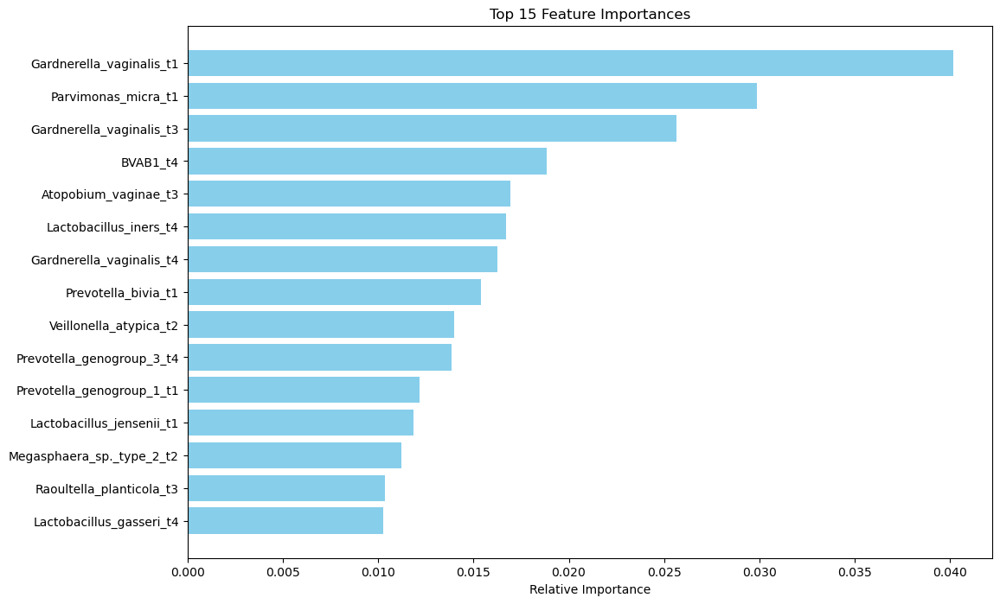

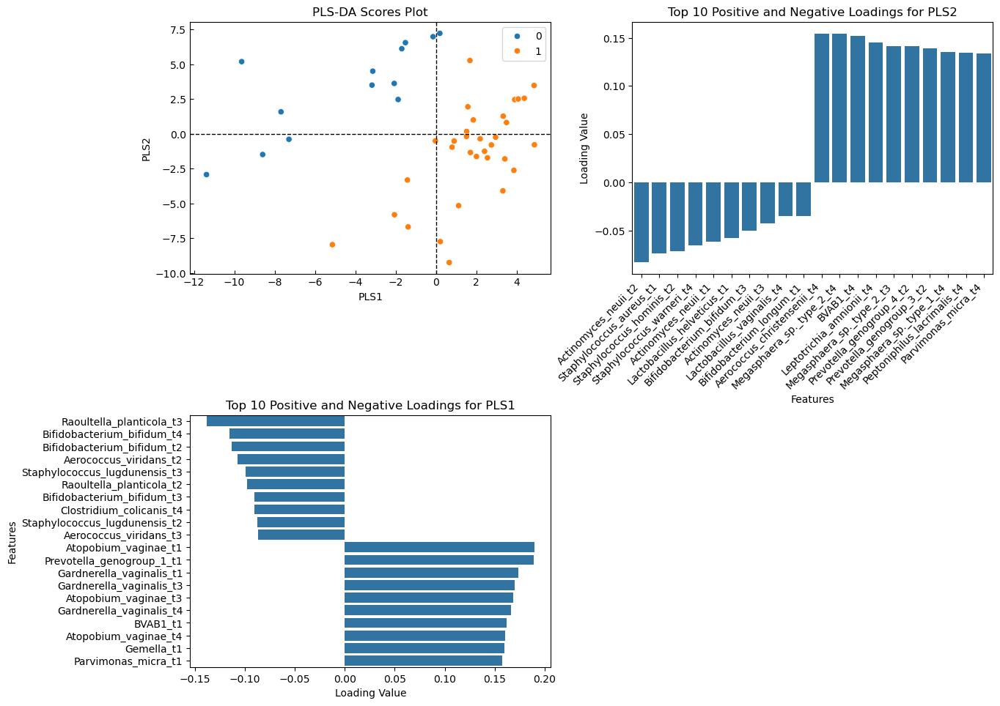

,accuracy,precision,recall,f1,specificity,mse,auc
Random Forest,0.71,0.75,0.91,0.82,0.25,0.29,0.87
Logistic Regression,0.67,0.76,0.82,0.77,0.33,0.33,0.74
Linear SVM,0.67,0.76,0.82,0.77,0.33,0.33,0.73
RBF SVM,0.69,0.77,0.85,0.79,0.33,0.31,0.68
K-Nearest Neighbors,0.60,0.68,0.85,0.75,0.00,0.40,0.71
Gradient Boosting,0.71,0.80,0.82,0.80,0.48,0.29,0.84
PLS-DA,0.67,0.75,0.82,0.77,0.33,0.33,0.77
Random Guess,0.71,0.71,1.00,0.83,0.00,0.29,0.86


In [27]:
df_4 = flatten(X_4)
#random_forest_model(df_4,y_4)
RForest_top_features_plot(df_4,y_4,numb_features=15)
scores, loadings = plsda_scores_loading(df_4,y_4,numb_loadings=10)
all_model_evaluation(df_4,y_4,test=True,n_splits=3)

Cross-validated accuracies: [0.6666666666666666, 1.0, 0.7777777777777778, 0.6666666666666666, 0.5]
Mean cross-validated accuracy: 0.72
                     accuracy  precision  recall    f1  specificity   mse  \
Random Forest            0.77       0.77    0.75  0.72         0.81  0.23   
Logistic Regression      0.70       0.65    0.78  0.68         0.65  0.30   
Linear SVM               0.68       0.63    0.78  0.66         0.61  0.32   
RBF SVM                  0.79       0.77    0.78  0.75         0.81  0.21   
K-Nearest Neighbors      0.81       0.82    0.78  0.77         0.85  0.19   
Gradient Boosting        0.77       0.73    0.85  0.75         0.74  0.23   
PLS-DA                   0.77       0.75    0.78  0.73         0.77  0.23   
Random Guess             0.59       0.00    0.00  0.00         1.00  0.41   

                      auc  
Random Forest        0.85  
Logistic Regression  0.60  
Linear SVM           0.58  
RBF SVM              0.81  
K-Nearest Neighbors  0.83  
Gra

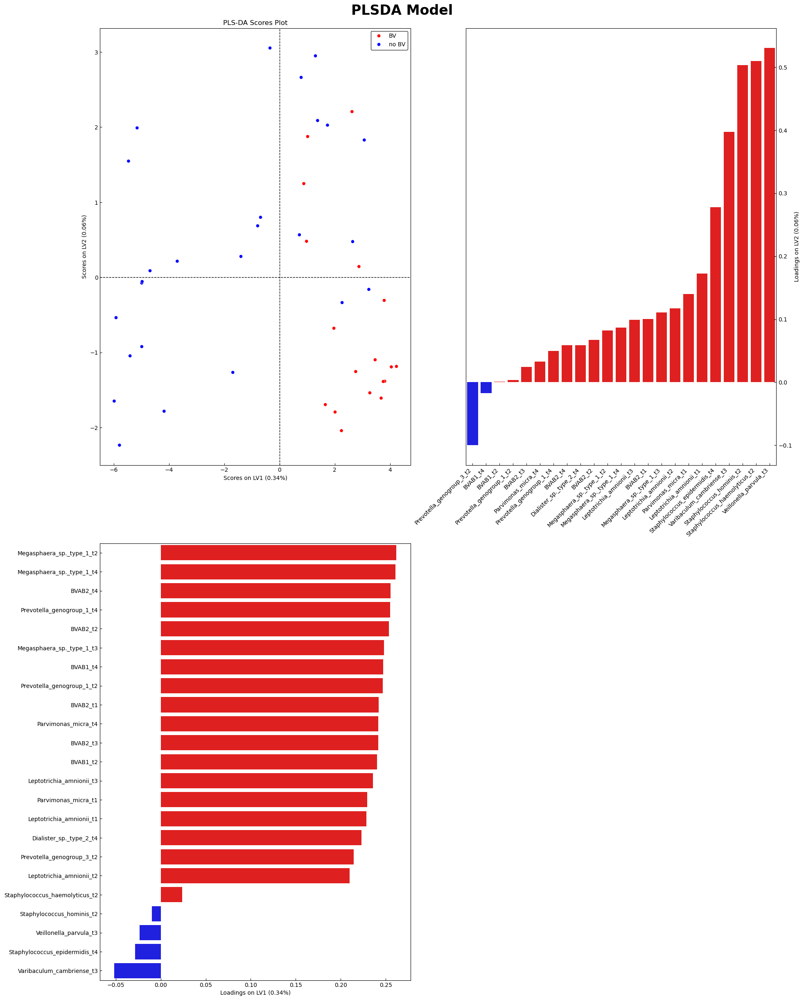

In [3]:
model = plsda_model(df_3,y_3)
vip_feat, df_vip_values = function_vip(df_3,y_3,model,thres=1.5)
print(all_model_evaluation(df_3[vip_feat],y_3,test=True)) #VIP features
PLSDA_plots(df_3[vip_feat], y_3, num_components=2)

# X=Premenses,y=amsel, CST grouped

In [31]:
import warnings
# Suppress all warnings globally
warnings.filterwarnings("ignore")
from QE_functions import *
df_clinic = create_amsel_label()
df = df_abundance_amsel(df_clinic,filename=None, log=True, rel_abund=True, zscore=True, cst=True)

log transformed data


In [36]:
df['CST_HL'].value_counts()

CST_HL
4.0    743
3.0    552
2.0    177
1.0     91
5.0     31
Name: count, dtype: int64

In [33]:
X, y = menstruation_xblock_y_premensesX(df) #X=premenses data
X, y = drop_blocks(X,y,thres=4)
(X_1, y_1), (X_2, y_2), (X_3, y_3), (X_4, y_4), (X_5, y_5) = split_blocks_by_CST_most_frequent(X, y)
lst = [(X_1, y_1), (X_2, y_2), (X_3, y_3), (X_4, y_4), (X_5, y_5)]
lst_X = [X_1,X_2,X_3,X_4,X_5]
lst_y = [y_1,y_2,y_3,y_4,y_5]
for i in range(len(lst_y)):
    print('number of samples in CST{}: {}'.format(i+1,len(lst_y[i])))
    print('number of cases get BV post menses ',sum(lst_y[i]==1))

#lstm_model(X_3,y_3,padding_value = -1000,n_folds=3)

Number of x_blocks (X): 68
Shape of labels (y): (68,)
Filtered number of x_blocks: 49
Filtered shape of labels (y): (49,)
Number of 1s: 13
Number of 0s: 36
cst counts:  CST_HL
3.0    13
4.0     7
1.0     1
Name: count, dtype: int64
cst counts:  CST_HL
4.0    13
3.0    11
Name: count, dtype: int64
cst counts:  CST_HL
4.0    8
3.0    6
Name: count, dtype: int64
cst counts:  CST_HL
3.0    15
2.0     4
4.0     4
Name: count, dtype: int64
cst counts:  CST_HL
4.0    2
3.0    2
Name: count, dtype: int64
cst counts:  CST_HL
4.0    5
3.0    4
2.0    4
Name: count, dtype: int64
cst counts:  CST_HL
2.0    4
3.0    2
4.0    1
Name: count, dtype: int64
cst counts:  CST_HL
4.0    14
3.0     1
Name: count, dtype: int64
cst counts:  CST_HL
4.0    19
3.0     8
Name: count, dtype: int64
cst counts:  CST_HL
4.0    6
Name: count, dtype: int64
cst counts:  CST_HL
4.0    18
Name: count, dtype: int64
cst counts:  CST_HL
3.0    12
4.0     7
Name: count, dtype: int64
cst counts:  CST_HL
3.0    19
Name: count, 

In [52]:
for i in range(len(lst_X)):
    print('CST {}'.format(i+1))
    try: 
        lstm_model(lst_X[i], lst_y[i], padding_value=-1000, n_folds=3)
    except Exception as e:
        print("An error occurred: ", e)

CST 1
An error occurred:  max() iterable argument is empty
CST 2
Training fold 1...
Epoch 1/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - accuracy: 1.0000 - loss: 0.3115 - val_accuracy: 0.5000 - val_loss: 0.6563
Epoch 2/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - accuracy: 0.5000 - loss: 0.4151 - val_accuracy: 0.5000 - val_loss: 0.6969
Epoch 3/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - accuracy: 0.0000e+00 - loss: 2.9533 - val_accuracy: 0.0000e+00 - val_loss: 0.7583
Epoch 4/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - accuracy: 0.5000 - loss: 0.7402 - val_accuracy: 0.5000 - val_loss: 0.7241
Epoch 5/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - accuracy: 0.5000 - loss: 1.4439 - val_accuracy: 0.5000 - val_loss: 0.7224
Epoch 6/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.5000 - loss: 2.0014 - val_accuracy: 0.5000 - val_loss: 0.7298
Epoch 7/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - accuracy: 0.5000 - loss: 1.9145 - val_accuracy: 0.5000 - val_loss: 0.7332
Epoch 8/50
1/1 ━━━━━━━━━━━━━━━━━━━━

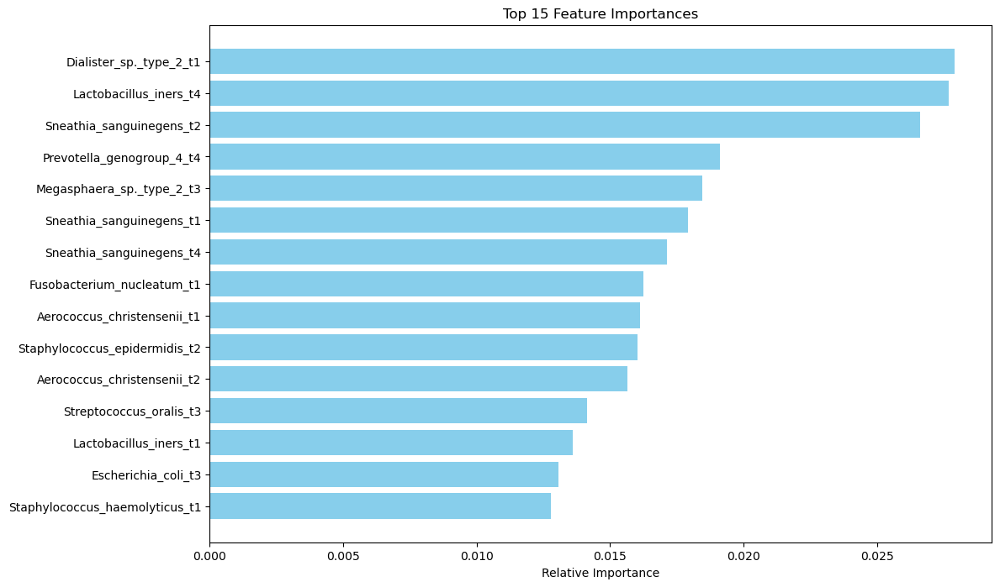

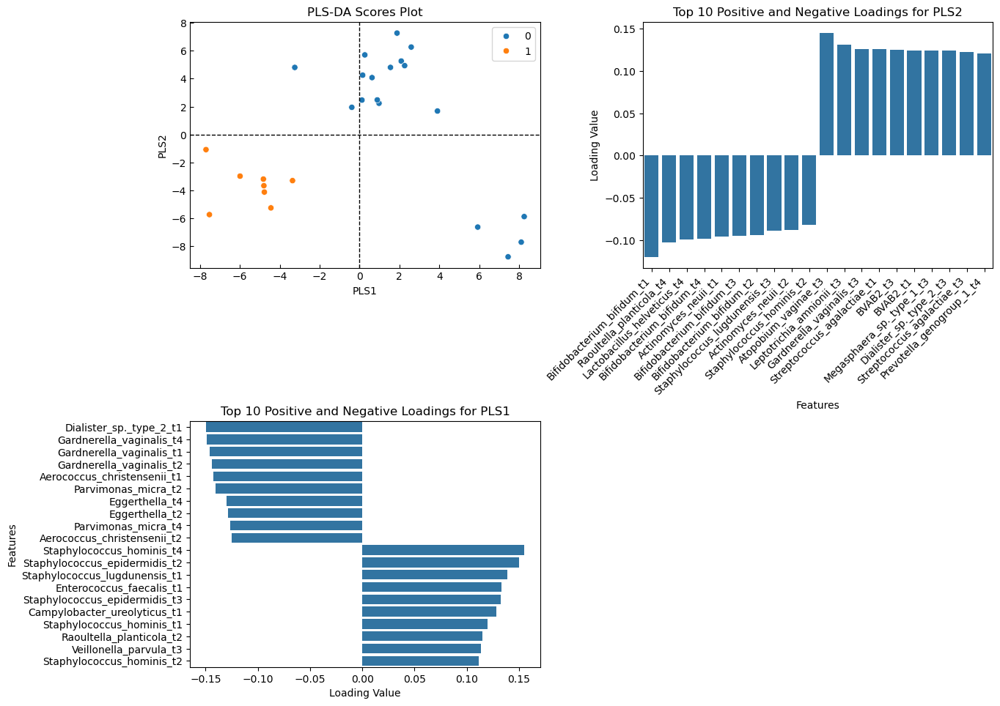

,accuracy,precision,recall,f1,specificity,mse,auc
Random Forest,0.65,0.00,0.00,0.00,0.94,0.35,0.26
Logistic Regression,0.62,0.28,0.28,0.27,0.78,0.38,0.49
Linear SVM,0.57,0.25,0.28,0.24,0.72,0.43,0.24
RBF SVM,0.57,0.23,0.28,0.23,0.72,0.43,0.21
K-Nearest Neighbors,0.62,0.22,0.28,0.24,0.78,0.38,0.59
Gradient Boosting,0.46,0.07,0.17,0.10,0.61,0.54,0.27
PLS-DA,0.58,0.22,0.28,0.24,0.72,0.42,0.43
Random Guess,0.69,0.00,0.00,0.00,1.00,0.31,0.65


In [55]:
df_4= flatten(X_4)
#random_forest_model(df_3,y_3)
RForest_top_features_plot(df_4,y_4,numb_features=15)
scores, loadings = plsda_scores_loading(df_4,y_4,numb_loadings=10)
all_model_evaluation(df_4,y_4,test=True,n_splits=3)

# BV -> healthy and healthy -> BV (Nugent) 

4 labels: considering both premenses and post menses data: 

premenses: no_BV, post_menses: no_BV: healthy->healthy (label=0)

premenses: no_BV, post_menses: has BV: healthy->BV (label=1)

premenses: has BV, post_menses: no_BV: BV->healthy (label=2)

premenses: has BV, post_menses: has BV: BV->BV (label=3)

In [56]:
import warnings
# Suppress all warnings globally
warnings.filterwarnings("ignore")
from QE_functions import *
df = df_abundance_nugent(filename=None, log=True, rel_abund=False, zscore=False,cst=False)
df
X, y = menstruation_xblock_y_premensesX(df,menses_included=False,four_labels=True)
X, y = drop_blocks(X,y,thres=4)
#(X_1, y_1), (X_2, y_2), (X_3, y_3), (X_4, y_4), (X_5, y_5) = split_blocks_by_CST_most_frequent(X, y)
#lstm_model(X,y,padding_value = -1000,n_folds=5)

log transformed data
Number of x_blocks (X): 239
Shape of labels (y): (239,)
Filtered number of x_blocks: 171
Filtered shape of labels (y): (171,)
Number of 1s: 8
Number of 0s: 88
Number of 2s: 14
Number of 3s: 61


In [60]:
X_0_1,y_0_1 = binary_label_selection(X,y,label1=2,label2=3)
lstm_model(X_0_1,y_0_1,padding_value = -1000,n_folds=3)

Training fold 1...
Epoch 1/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 350ms/step - accuracy: 0.3650 - loss: 1.1713 - val_accuracy: 0.7600 - val_loss: 0.5708
Epoch 2/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - accuracy: 0.5104 - loss: 1.0181 - val_accuracy: 0.6800 - val_loss: 0.6384
Epoch 3/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.6825 - loss: 0.6464 - val_accuracy: 0.7600 - val_loss: 0.5509
Epoch 4/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step - accuracy: 0.7538 - loss: 0.5708 - val_accuracy: 0.7600 - val_loss: 0.5356
Epoch 5/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - accuracy: 0.6721 - loss: 0.8090 - val_accuracy: 0.7200 - val_loss: 0.5275
Epoch 6/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step - accuracy: 0.7937 - loss: 0.4184 - val_accuracy: 0.7200 - val_loss: 0.5426
Epoch 7/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step - accuracy: 0.7642 - loss: 0.5774 - val_accuracy: 0.7200 - val_loss: 0.5647
Epoch 8/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step - accuracy: 0.7833 - loss: 0.4851 - val_accuracy:

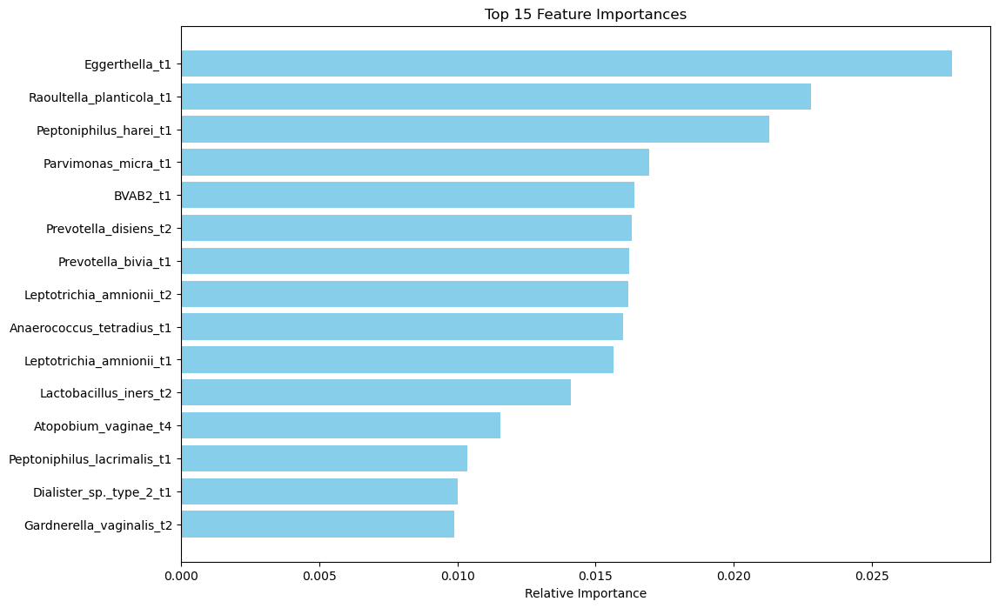

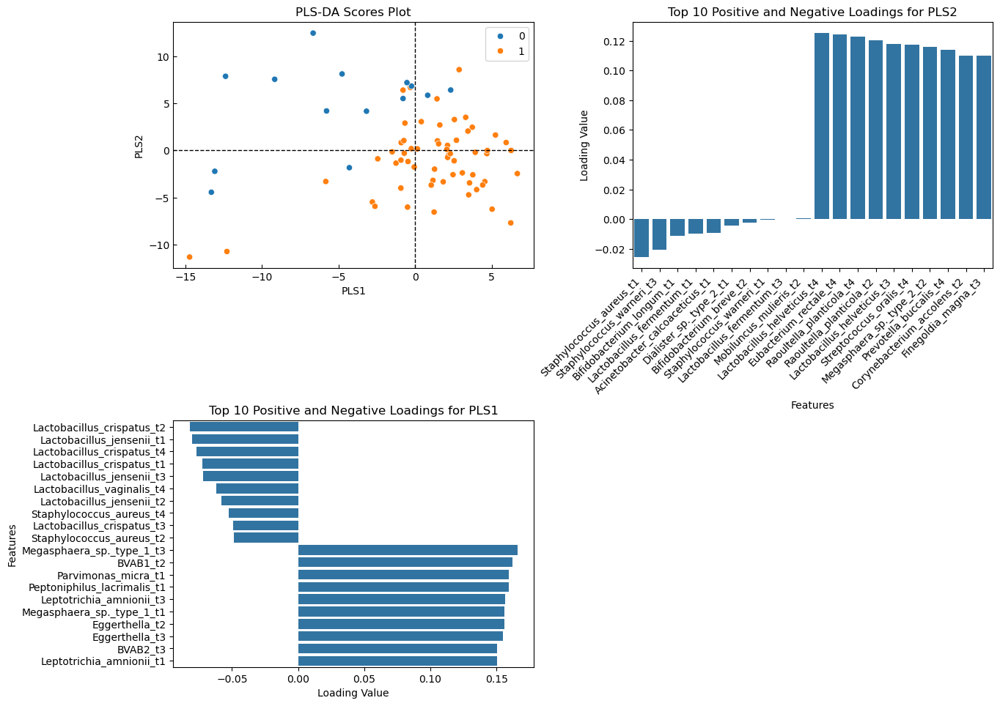

,accuracy,precision,recall,f1,specificity,mse,auc
Random Forest,0.79,0.81,0.97,0.88,0.00,0.21,0.88
Logistic Regression,0.84,0.85,0.98,0.91,0.23,0.16,0.83
Linear SVM,0.81,0.84,0.95,0.89,0.23,0.19,0.76
RBF SVM,0.80,0.81,0.98,0.89,0.00,0.20,0.76
K-Nearest Neighbors,0.80,0.81,0.98,0.89,0.00,0.20,0.90
Gradient Boosting,0.76,0.83,0.89,0.86,0.20,0.24,0.84
PLS-DA,0.79,0.82,0.95,0.88,0.08,0.21,0.83
Random Guess,0.81,0.81,1.00,0.90,0.00,0.19,0.91


In [61]:
df_0_1= flatten(X_0_1)
#random_forest_model(df_0_1,y_0_1)
RForest_top_features_plot(df_0_1,y_0_1,numb_features=15)
scores, loadings = plsda_scores_loading(df_0_1,y_0_1,numb_loadings=10)
all_model_evaluation(df_0_1,y_0_1,test=True,n_splits=3)

# March 26, Count how many days of metabolic data exist per sampleID

In [38]:
from QE_functions import *
df = df_abundance_nugent(filename=None, log=True, rel_abund=False, zscore=False, cst=True, metabolomics=True)
X, y = menstruation_xblock_y_premensesX(df,menses_included=False,four_labels=False)
X, y = drop_blocks(X,y,thres=4)
(X_1, y_1), (X_2, y_2), (X_3, y_3), (X_4, y_4), (X_5, y_5) = split_blocks_by_CST_most_frequent(X, y)
metabolic_count(df=None, X=X_4)

log transformed data
Number of x_blocks (X): 205
Shape of labels (y): (205,)
Filtered number of x_blocks: 146
Filtered shape of labels (y): (146,)
Number of 1s: 59
Number of 0s: 87
cst counts:  CST_HL
1.0    20
3.0     1
Name: count, dtype: int64
cst counts:  CST_HL
4.0    3
3.0    3
Name: count, dtype: int64
cst counts:  CST_HL
4.0    23
Name: count, dtype: int64
cst counts:  CST_HL
3.0    13
4.0     6
1.0     1
Name: count, dtype: int64
cst counts:  CST_HL
4.0    13
3.0    11
Name: count, dtype: int64
cst counts:  CST_HL
4.0    8
3.0    6
Name: count, dtype: int64
cst counts:  CST_HL
3.0    15
2.0     4
4.0     4
Name: count, dtype: int64
cst counts:  CST_HL
4.0    2
3.0    2
Name: count, dtype: int64
cst counts:  CST_HL
3.0    12
2.0    10
4.0     4
5.0     1
Name: count, dtype: int64
cst counts:  CST_HL
3.0    12
4.0     2
Name: count, dtype: int64
cst counts:  CST_HL
4.0    5
2.0    3
3.0    2
Name: count, dtype: int64
cst counts:  CST_HL
2.0    4
3.0    2
4.0    1
Name: count, dt

In [39]:
metabolic_count(df=None, X=X)

block number 0 has 0 metabolic days
block number 1 has 0 metabolic days
block number 2 has 0 metabolic days
block number 3 has 6 metabolic days
block number 4 has 9 metabolic days
block number 5 has 6 metabolic days
block number 6 has 0 metabolic days
block number 7 has 0 metabolic days
block number 8 has 0 metabolic days
block number 9 has 2 metabolic days
block number 10 has 2 metabolic days
block number 11 has 4 metabolic days
block number 12 has 3 metabolic days
block number 13 has 0 metabolic days
block number 14 has 4 metabolic days
block number 15 has 0 metabolic days
block number 16 has 0 metabolic days
block number 17 has 0 metabolic days
block number 18 has 4 metabolic days
block number 19 has 0 metabolic days
block number 20 has 6 metabolic days
block number 21 has 2 metabolic days
block number 22 has 5 metabolic days
block number 23 has 4 metabolic days
block number 24 has 2 metabolic days
block number 25 has 7 metabolic days
block number 26 has 2 metabolic days
block numbe

Samples underwent MNZ therapy: 3, 5, 17, 35, 53, 55, 65, 127, 128, 130, 135

# Apr 3, Validation using Gajer cohort

In [37]:
import pandas as pd 
filename = '/Users/bonakdar/Desktop/Arnold Lab/QE/HMP/HMP_ALL_DATA_Release2_with_METABOLOMICS_ALL_12172017.xlsx'
filename = '/Users/bonakdar/Downloads/3003605tableS2.xlsx'
# Load your DataFrame
df = pd.read_excel(filename)
df = df.drop(index=[0, 1, 2])
# Use the values in the fourth row as column names
new_header = df.iloc[0]  # Take the first row of the remaining DataFrame as the header
df = df[1:]      # Take the data less the header row
df
df.columns = new_header  # Set the header row as the DataFrame's column names

# Reset the index (optional, but often useful)
df.reset_index(drop=True, inplace=True)
df

3,Sample ID,Time in study,Subject ID,Racea,Age,Nugent Score,Nugent Categoryb,Community State Typec,Total Read Countsd,NaN,...,Porphyrobacter,Clostridiales.16,Bacteria.1,Sphingomonadaceae.1,Streptomycetaceae.1,Archaea.8,Burkholderiales.1,Gammaproteobacteria.1,Truepera,Yersinia
0,400_010106,1,20,0,45,NaN,NaN,IV-A,2252,NaN,...,0,0,0,0,0,0,0,0,0,0
1,400_010506,5,20,0,45,0,Low,III,2319,NaN,...,0,0,0,0,0,0,0,0,0,0
2,400_010806,8,20,0,45,0,Low,III,2626,NaN,...,0,0,0,0,0,0,0,0,0,0
3,400_011206,12,20,0,45,0,Low,III,2408,NaN,...,0,0,0,0,0,0,0,0,0,0
4,400_011906,19,20,0,45,1,Low,III,2451,NaN,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
932,446_060307,94,16,1,33,NaN,NaN,III,2040,NaN,...,0,0,0,0,0,0,0,0,0,0
933,446_060507,96,16,1,33,0,Low,III,1986,NaN,...,0,0,0,0,0,0,0,0,0,0
934,446_061207,103,16,1,33,0,Low,III,1917,NaN,...,0,0,0,0,0,0,0,0,0,0
935,446_061507,106,16,1,33,0,Low,III,1948,NaN,...,0,0,0,0,0,0,0,0,0,0


In [32]:
df.columns[10:]

Index(['L. iners', 'L. crispatus', 'Atopobium', 'L. gasseri', 'Prevotella',
       'Parvimonas', 'Sneathia', 'L. jensenii', 'Gardnerella', 'Peptoniphilus',
       ...
       'Porphyrobacter', 'Clostridiales.16', 'Bacteria.1',
       'Sphingomonadaceae.1', 'Streptomycetaceae.1', 'Archaea.8',
       'Burkholderiales.1', 'Gammaproteobacteria.1', 'Truepera', 'Yersinia'],
      dtype='object', name=3, length=330)

In [34]:
from QE_functions import *
df = df_abundance_nugent(filename=None, log=True, rel_abund=False, zscore=False, cst=True, metabolomics=True)
df

log transformed data


,SERIAL,PID,Metabolomics,MENSTRUATION,CST_HL,Lactobacillus_iners,Gardnerella_vaginalis,Lactobacillus_crispatus,Atopobium_vaginae,Lactobacillus_jensenii,...,Alloscardovia_omnicolens,Lactobacillus_helveticus,Actinomyces_urogenitalis,Peptostreptococcus_stomatis,Acinetobacter_calcoaceticus,Staphylococcus_warneri,Streptococcus_sanguinis,Bacteroides_uniformis,Aerococcus_viridans,NUGENT_CLASS
0,1.0,1,0,NaN,1.0,7.281386,2.397895,9.978734,2.639057,6.871091,...,2.639057,6.236370,3.526361,0.693147,-23.025851,-23.025851,-23.025851,-23.025851,4.653960,NO_BV
1,2.0,1,0,NaN,1.0,8.708309,4.644391,11.451273,2.397895,8.434898,...,4.262680,7.623642,1.945910,-23.025851,0.000000,-23.025851,0.000000,0.000000,0.000000,NO_BV
2,3.0,1,0,NaN,1.0,8.650850,5.575949,9.403684,0.000000,6.476972,...,4.779123,6.063785,-23.025851,-23.025851,-23.025851,-23.025851,-23.025851,0.000000,2.708050,NO_BV
3,4.0,1,0,NaN,1.0,9.396156,5.236442,10.812250,5.141664,8.139149,...,7.454141,7.063904,3.433987,0.693147,-23.025851,-23.025851,-23.025851,0.000000,0.000000,NO_BV
4,5.0,1,0,NaN,1.0,8.093768,2.197225,10.632798,1.945910,7.605392,...,3.610918,6.951772,2.197225,4.510860,-23.025851,-23.025851,-23.025851,3.433987,4.948760,NO_BV
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4047,64.0,135,0,NaN,2.0,11.603799,6.232448,9.464517,3.850148,8.248267,...,3.663562,7.876259,0.000000,0.000000,-23.025851,1.098612,0.000000,3.367296,-23.025851,INTER_BV
4048,65.0,135,0,NaN,2.0,6.025866,3.871201,5.117994,3.258097,2.890372,...,-23.025851,3.433987,-23.025851,-23.025851,-23.025851,-23.025851,-23.025851,0.000000,-23.025851,NO_BV
4049,66.0,135,0,NaN,2.0,11.622139,6.492240,9.415238,4.812184,8.211754,...,4.276666,7.866339,3.135494,1.386294,-23.025851,-23.025851,-23.025851,3.401197,-23.025851,NO_BV
4050,67.0,135,0,NaN,3.0,4.962845,3.970292,4.595120,2.079442,2.079442,...,-23.025851,2.484907,-23.025851,-23.025851,-23.025851,-23.025851,-23.025851,-23.025851,-23.025851,NO_BV


In [36]:
df.columns

Index(['SERIAL', 'PID', 'Metabolomics', 'MENSTRUATION', 'CST_HL',
       'Lactobacillus_iners', 'Gardnerella_vaginalis',
       'Lactobacillus_crispatus', 'Atopobium_vaginae',
       'Lactobacillus_jensenii', 'Megasphaera_sp._type_1', 'BVAB2',
       'Bifidobacterium_bifidum', 'Aerococcus_christensenii',
       'Lactobacillus_gasseri', 'Streptococcus_agalactiae', 'Parvimonas_micra',
       'Megasphaera_sp._type_2', 'Prevotella_genogroup_2',
       'Streptococcus_anginosus', 'Enterococcus_faecalis', 'BVAB3',
       'Finegoldia_magna', 'BVAB1', 'Staphylococcus_lugdunensis',
       'Prevotella_genogroup_1', 'Dialister_sp._type_2',
       'Leptotrichia_amnionii', 'Gemella', 'Anaerococcus_tetradius',
       'Peptoniphilus_lacrimalis', 'Prevotella_bivia', 'Eggerthella',
       'Veillonella_montpellierensis', 'Sneathia_sanguinegens',
       'Prevotella_genogroup_3', 'Staphylococcus_aureus',
       'Peptoniphilus_asaccharolyticus', 'Mobiluncus_curtisii',
       'Lactobacillus_vaginalis', 'Prev

# Apr 7, HMP Data

Kelly asked for PLS-DA plots of CST-II, CST-III, and CST-IV. Make sure to generate the orthogonalized and drop samples with equal days between 2 CSTs

In [1]:
import warnings
# Suppress all warnings globally
warnings.filterwarnings("ignore")
from QE_functions import *
df = df_abundance_nugent(filename=None, log=True, rel_abund=False, zscore=False,cst=True, metabolomics=False)
X, y = menstruation_xblock_y_premensesX(df, menses_included=False,four_labels=False) #X=premenses data
print(np.unique(y, return_counts=True))
X, y = drop_blocks(X,y,thres=4)
(X_1, y_1), (X_2, y_2), (X_3, y_3), (X_4, y_4), (X_5, y_5) = split_blocks_by_CST_most_frequent(X, y, equal_selection=False)


log transformed data
Number of x_blocks (X): 205
Shape of labels (y): (205,)
(array([0, 1]), array([122,  83]))
Filtered number of x_blocks: 146
Filtered shape of labels (y): (146,)
Number of 1s: 59
Number of 0s: 87
length of X_1 and y_1:  29 29
length of X_2 and y_2:  20 20
length of X_3 and y_3:  41 41
length of X_4 and y_4:  43 43
length of X_5 and y_5:  4 4


In [2]:
lst_y = [y_1,y_2,y_3,y_4,y_5]
for i in range(len(lst_y)):
    print('number of samples in CST{}: {}'.format(i+1,len(lst_y[i])))
    print('number of cases get BV post menses ',sum(lst_y[i]==1))

number of samples in CST1: 29
number of cases get BV post menses  1
number of samples in CST2: 20
number of cases get BV post menses  9
number of samples in CST3: 41
number of cases get BV post menses  16
number of samples in CST4: 43
number of cases get BV post menses  30
number of samples in CST5: 4
number of cases get BV post menses  0


In [10]:
# 5-folds CV on LSTM model for CST II, III, IV: 
lstm_model(X_4, y_4, padding_value=-10000, n_folds=3)

Training fold 1...
Epoch 1/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - accuracy: 0.4643 - loss: 1.4441 - val_accuracy: 0.6667 - val_loss: 0.6046
Epoch 2/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step - accuracy: 0.7500 - loss: 0.9742 - val_accuracy: 0.6667 - val_loss: 0.5775
Epoch 3/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step - accuracy: 0.7143 - loss: 0.5980 - val_accuracy: 0.7333 - val_loss: 0.5625
Epoch 4/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step - accuracy: 0.6071 - loss: 0.7327 - val_accuracy: 0.7333 - val_loss: 0.5458
Epoch 5/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step - accuracy: 0.7500 - loss: 0.4724 - val_accuracy: 0.7333 - val_loss: 0.6215
Epoch 6/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step - accuracy: 0.8571 - loss: 0.2898 - val_accuracy: 0.7333 - val_loss: 0.6643
Epoch 7/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step - accuracy: 0.8571 - loss: 0.4738 - val_accuracy: 0.7333 - val_loss: 0.6585
Epoch 8/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step - accuracy: 0.8214 - loss: 0.4616 - val_accuracy: 0.

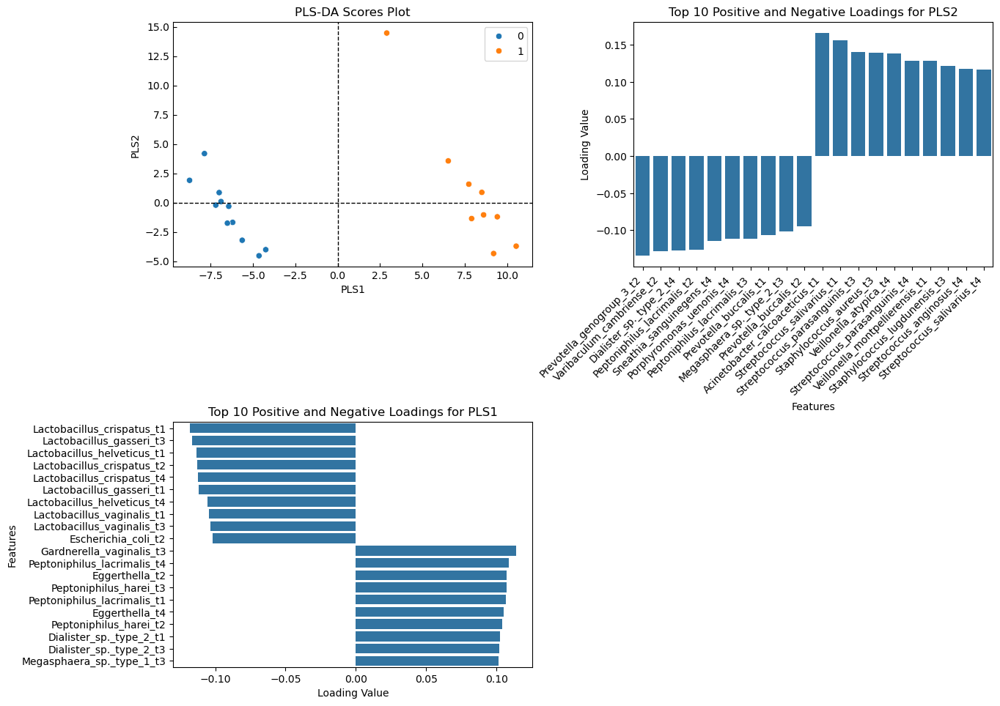

,accuracy,precision,recall,f1,specificity,mse,auc
Random Forest,0.85,0.87,0.89,0.85,0.83,0.15,0.95
Logistic Regression,0.85,0.87,0.89,0.85,0.83,0.15,0.95
Linear SVM,0.85,0.87,0.89,0.85,0.83,0.15,0.95
RBF SVM,0.90,0.92,0.89,0.89,0.92,0.10,0.97
K-Nearest Neighbors,0.85,0.81,0.89,0.84,0.81,0.15,0.94
Gradient Boosting,0.74,0.70,0.89,0.77,0.61,0.26,0.90
PLS-DA,0.90,0.92,0.89,0.89,0.92,0.10,0.95
Random Guess,0.55,0.00,0.00,0.00,1.00,0.45,0.73


In [6]:
df_2 = flatten(X_2)
#random_forest_model(df_4,y_4)
#RForest_top_features_plot(df_4,y_4,numb_features=15)
scores, loadings = plsda_scores_loading(df_2,y_2,numb_loadings=10, orthogonalize=True)
all_model_evaluation(df_2,y_2,test=True,n_splits=3)

In [7]:
#save for elastic net
matlab_ddm_save_data(df_2,y_2)

In [8]:
y_2

array([0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0])

In [14]:
#Run with selected features using elastic net
import pandas as pd 
df = pd.read_csv('Data_Nugent_premenses_CST2/X_CST2_top_features.csv')
df = df.iloc[:,1:]
all_model_evaluation(df,y_2,test=True,n_splits=3)

,accuracy,precision,recall,f1,specificity,mse,auc
Random Forest,0.80,0.83,0.89,0.82,0.75,0.20,0.95
Logistic Regression,1.00,1.00,1.00,1.00,1.00,0.00,1.00
Linear SVM,1.00,1.00,1.00,1.00,1.00,0.00,1.00
RBF SVM,1.00,1.00,1.00,1.00,1.00,0.00,1.00
K-Nearest Neighbors,0.95,0.92,1.00,0.95,0.92,0.05,1.00
Gradient Boosting,0.69,0.62,0.89,0.73,0.53,0.31,0.81
PLS-DA,1.00,1.00,1.00,1.00,1.00,0.00,1.00
Random Guess,0.55,0.00,0.00,0.00,1.00,0.45,0.73


# April 8: Create train_test split on whole dataset, do feature selection on train and test on test set

In [1]:
from sklearn.model_selection import train_test_split
import warnings
# Suppress all warnings globally
warnings.filterwarnings("ignore")
from QE_functions import *
df = df_abundance_nugent(filename=None, log=True, rel_abund=False, zscore=False,cst=False, metabolomics=False)
X, y = menstruation_xblock_y_premensesX(df, menses_included=False,four_labels=False) #X=premenses data
print(np.unique(y, return_counts=True))
X, y = drop_blocks(X,y,thres=4)


log transformed data
Number of x_blocks (X): 239
Shape of labels (y): (239,)
(array([0, 1]), array([141,  98]))
Filtered number of x_blocks: 171
Filtered shape of labels (y): (171,)
Number of 1s: 69
Number of 0s: 102


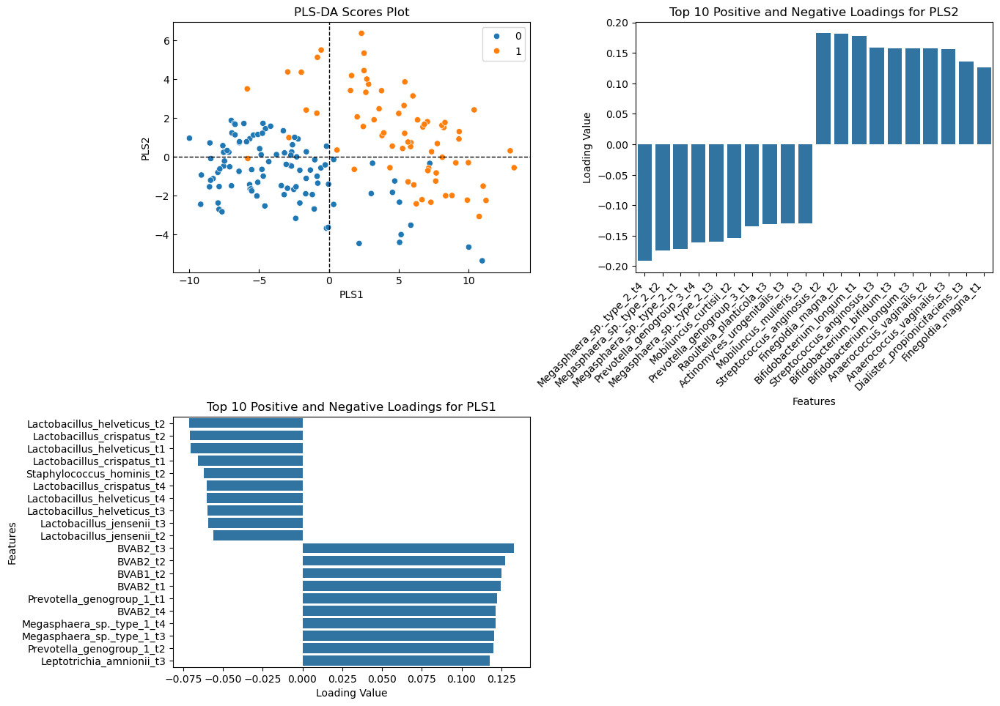

,accuracy,precision,recall,f1,specificity,mse,auc
Random Forest,0.82,0.83,0.72,0.77,0.89,0.18,0.81
Logistic Regression,0.78,0.74,0.70,0.72,0.83,0.22,0.72
Linear SVM,0.75,0.69,0.68,0.69,0.79,0.25,0.72
RBF SVM,0.80,0.73,0.81,0.77,0.79,0.20,0.79
K-Nearest Neighbors,0.80,0.78,0.71,0.74,0.86,0.20,0.68
Gradient Boosting,0.74,0.69,0.67,0.68,0.79,0.26,0.67
PLS-DA,0.81,0.78,0.72,0.75,0.86,0.19,0.80
Random Guess,0.60,0.00,0.00,0.00,1.00,0.40,0.70


In [2]:
#no feature selection 
df = flatten(X)
#random_forest_model(df_4,y_4)
#RForest_top_features_plot(df_4,y_4,numb_features=15)
scores, loadings = plsda_scores_loading(df,y,numb_loadings=10, orthogonalize=True)
all_model_evaluation(df,y,test=True,n_splits=3)

In [3]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(
    df, y, 
    test_size=0.2,     # You can change this to the proportion of the dataset you want to allocate to the test set
    random_state=42,   # This can be any integer. It's a seed for the random number generator to ensure reproducible results
    stratify=y,         # This ensures stratification
    shuffle=True
)



In [27]:
#save for elastic net
matlab_ddm_save_data(X_train,y_train)

In [3]:
from Elastic_Net_functions import *
xblock, yblock, xnames, patients = read_files('Data_Nugent_premenses_0.8train_of_whole_data')
#num_runs = 500 #total number of sample subsets and iterations
#all_disease_data, all_cntrl_data = resample_creation(xblock, yblock, num_runs=num_runs, r=0.8)
#all_B_min = elastic_network(all_disease_data, all_cntrl_data, num_runs=num_runs) 
#a = pd.DataFrame(all_B_min)
#a.to_csv('/Users/bonakdar/Desktop/all_B_min.csv')

In [2]:
import pandas as pd
all_B_min = pd.read_csv('Data_Nugent_premenses_0.8train_of_whole_data/all_B_min.csv')
all_B_min = all_B_min.iloc[:,1:]

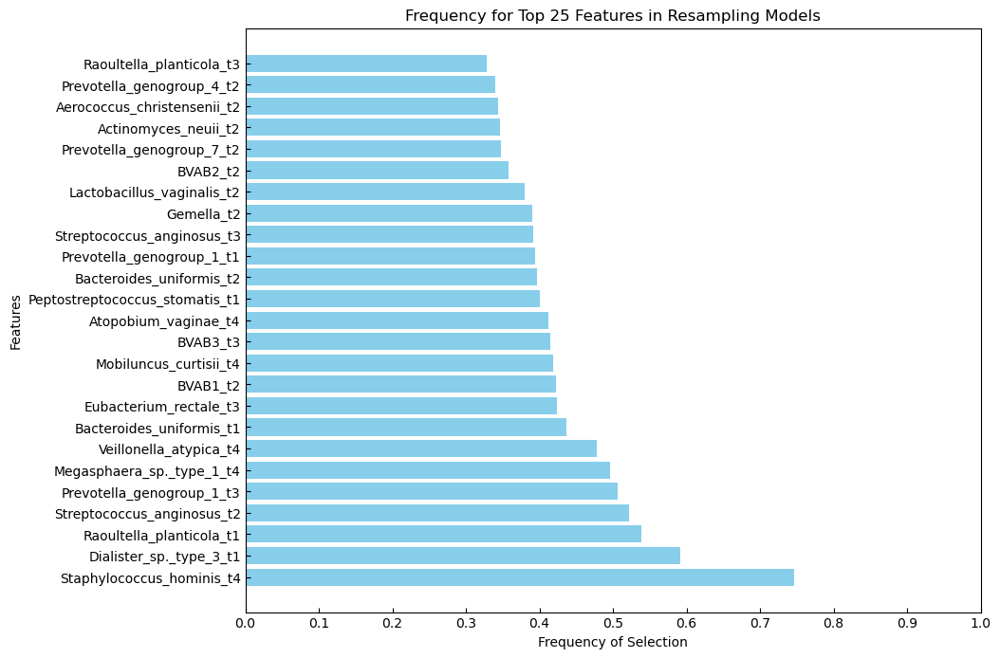

best number of features =  33


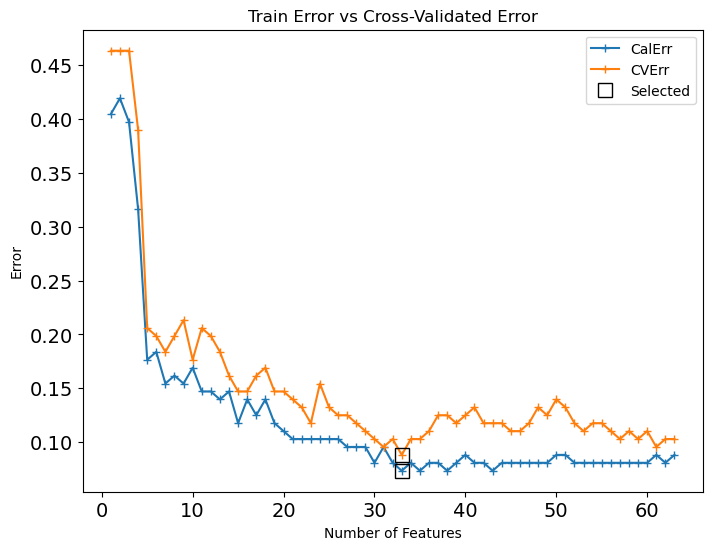

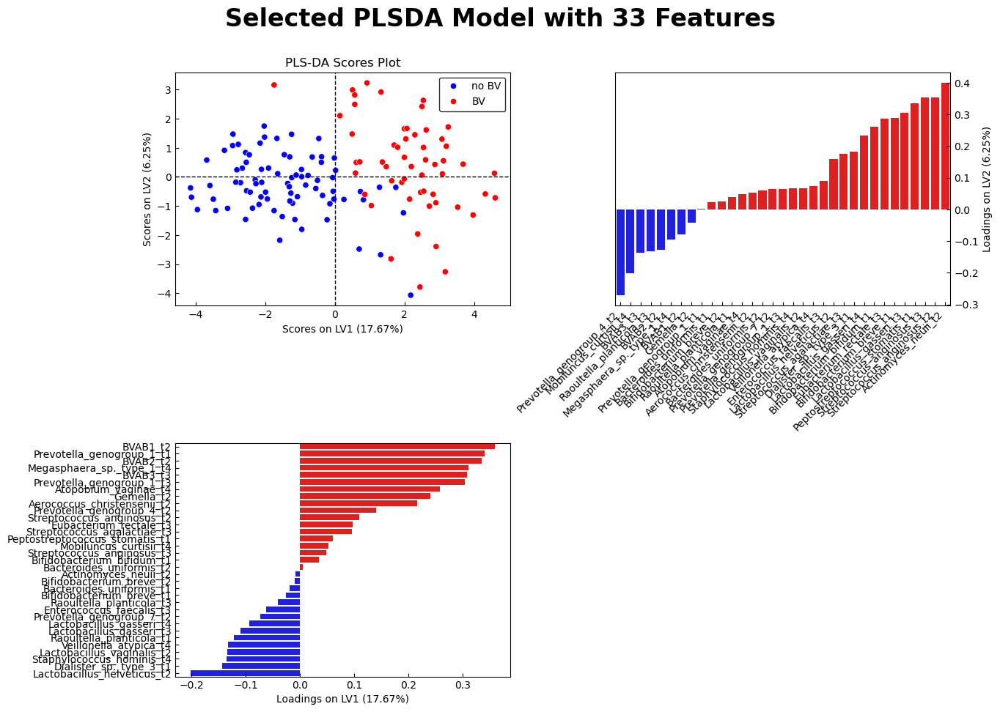

Calibration Error:  [0.07352941]
CV Error:  [0.08823529]
Random feature Selections beat selected features 0% of the times
T-statistic: [-4.80604554]
P-value: [2.04010445e-06]


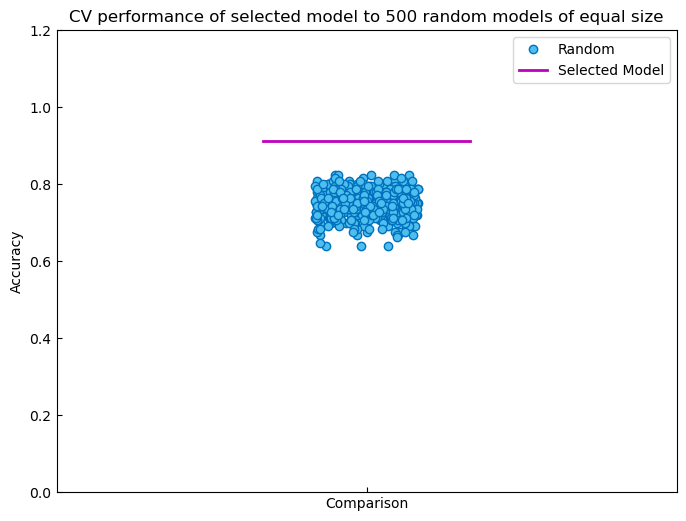

In [5]:
fr_sel_min = freq_of_selection(all_B_min,xnames)
plot_top_features(fr_sel_min,numb_of_features=25)
best_sel, tr_err_lst, te_err_lst = find_best_num_features(xblock, yblock, fr_sel_min,fraction_of_features=0.2)
plot_CV_Cal_err(best_sel, tr_err_lst, te_err_lst)
PLSDA_plots(best_sel, fr_sel_min, xblock, yblock, tr_err_lst, te_err_lst, num_components=2, orthogonalize=True)
rand_CV_accuracy, CV_accuracy_sel = random_best_comparison(xblock, yblock, te_err_lst, best_sel, num_rand_sets=500)
plot_cv_accuracy(rand_CV_accuracy, CV_accuracy_sel)

In [46]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(
    df, y, 
    test_size=0.2,     # You can change this to the proportion of the dataset you want to allocate to the test set
    random_state=42,   # This can be any integer. It's a seed for the random number generator to ensure reproducible results
    stratify=y,         # This ensures stratification
    shuffle=True
)
results = evaluate_classifiers(X_train, X_test, y_train, y_test)
results

,Model,Accuracy,Precision,Recall,F1 Score,Specificity,MSE,AUC
0,Random Forest,0.828571,0.722222,0.928571,0.812500,0.761905,0.171429,0.916667
1,Logistic Regression,0.800000,0.684211,0.928571,0.787879,0.714286,0.200000,0.819728
2,Linear SVM,0.800000,0.684211,0.928571,0.787879,0.714286,0.200000,0.823129
3,RBF SVM,0.771429,0.650000,0.928571,0.764706,0.666667,0.228571,0.914966
4,KNN,0.828571,0.785714,0.785714,0.785714,0.857143,0.171429,0.858844
5,GBDT,0.800000,0.684211,0.928571,0.787879,0.714286,0.200000,0.887755
6,PLS-DA,0.828571,0.750000,0.857143,0.800000,0.809524,0.171429,0.887755
7,Random Guess (Most Frequent),0.600000,0.000000,0.000000,0.000000,1.000000,0.400000,0.500000


In [5]:
from sklearn.model_selection import train_test_split
import pandas as pd
X_train, X_test, y_train, y_test = train_test_split(
    df, y, 
    test_size=0.2,     # You can change this to the proportion of the dataset you want to allocate to the test set
    random_state=42,   # This can be any integer. It's a seed for the random number generator to ensure reproducible results
    stratify=y,         # This ensures stratification
    shuffle=True
)

X_train = pd.read_csv('Data_Nugent_premenses_0.8train_of_whole_data/X_train_top_features.csv')
X_train = X_train.iloc[:,1:]
yblock = pd.read_csv('Data_Nugent_premenses_0.8train_of_whole_data/yblock.csv')
yblock = yblock.iloc[:,1:]
y_train = np.argmax(yblock, axis=1)
X_test = X_test.loc[:,X_train.columns]

results = evaluate_classifiers(X_train, X_test, y_train, y_test)
results

,Model,Accuracy,Precision,Recall,F1 Score,Specificity,MSE,AUC
0,Random Forest,0.771429,0.666667,0.857143,0.750000,0.714286,0.228571,0.874150
1,Logistic Regression,0.714286,0.666667,0.571429,0.615385,0.809524,0.285714,0.670068
2,Linear SVM,0.714286,0.642857,0.642857,0.642857,0.761905,0.285714,0.656463
3,RBF SVM,0.714286,0.642857,0.642857,0.642857,0.761905,0.285714,0.741497
4,KNN,0.742857,0.631579,0.857143,0.727273,0.666667,0.257143,0.721088
5,GBDT,0.828571,0.722222,0.928571,0.812500,0.761905,0.171429,0.875850
6,PLS-DA,0.771429,0.714286,0.714286,0.714286,0.809524,0.228571,0.875850
7,Random Guess (Most Frequent),0.600000,0.000000,0.000000,0.000000,1.000000,0.400000,0.500000


# April 9: CST III

In [1]:
import warnings
# Suppress all warnings globally
warnings.filterwarnings("ignore")
from QE_functions import *
df = df_abundance_nugent(filename=None, log=True, rel_abund=False, zscore=False,cst=True, metabolomics=False)
X, y = menstruation_xblock_y_premensesX(df, menses_included=False,four_labels=False) #X=premenses data
print(np.unique(y, return_counts=True))
X, y = drop_blocks(X,y,thres=4)
(X_1, y_1), (X_2, y_2), (X_3, y_3), (X_4, y_4), (X_5, y_5) = split_blocks_by_CST_most_frequent(X, y, equal_selection=False)


log transformed data
Number of x_blocks (X): 205
Shape of labels (y): (205,)
(array([0, 1]), array([122,  83]))
Filtered number of x_blocks: 146
Filtered shape of labels (y): (146,)
Number of 1s: 59
Number of 0s: 87
length of X_1 and y_1:  29 29
length of X_2 and y_2:  20 20
length of X_3 and y_3:  41 41
length of X_4 and y_4:  43 43
length of X_5 and y_5:  4 4


In [2]:
lst_y = [y_1,y_2,y_3,y_4,y_5]
for i in range(len(lst_y)):
    print('number of samples in CST{}: {}'.format(i+1,len(lst_y[i])))
    print('number of cases get BV post menses ',sum(lst_y[i]==1))

number of samples in CST1: 29
number of cases get BV post menses  1
number of samples in CST2: 20
number of cases get BV post menses  9
number of samples in CST3: 41
number of cases get BV post menses  16
number of samples in CST4: 43
number of cases get BV post menses  30
number of samples in CST5: 4
number of cases get BV post menses  0


In [8]:
# 5-folds CV on LSTM model for CST II, III, IV: 
lstm_model(X_3, y_3, padding_value=-10000, n_folds=3)

Training fold 1...
Epoch 1/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - accuracy: 0.5185 - loss: 1.0444 - val_accuracy: 0.7143 - val_loss: 0.6106
Epoch 2/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - accuracy: 0.6667 - loss: 0.5998 - val_accuracy: 0.7857 - val_loss: 0.5961
Epoch 3/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - accuracy: 0.8519 - loss: 0.3254 - val_accuracy: 0.6429 - val_loss: 0.5871
Epoch 4/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step - accuracy: 0.8519 - loss: 0.3179 - val_accuracy: 0.7857 - val_loss: 0.5619
Epoch 5/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - accuracy: 0.9259 - loss: 0.2331 - val_accuracy: 0.6429 - val_loss: 0.5710
Epoch 6/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - accuracy: 0.8519 - loss: 0.2481 - val_accuracy: 0.7857 - val_loss: 0.5657
Epoch 7/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - accuracy: 0.9630 - loss: 0.0958 - val_accuracy: 0.7143 - val_loss: 0.5679
Epoch 8/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - accuracy: 1.0000 - loss: 0.0619 - val_accuracy: 0.

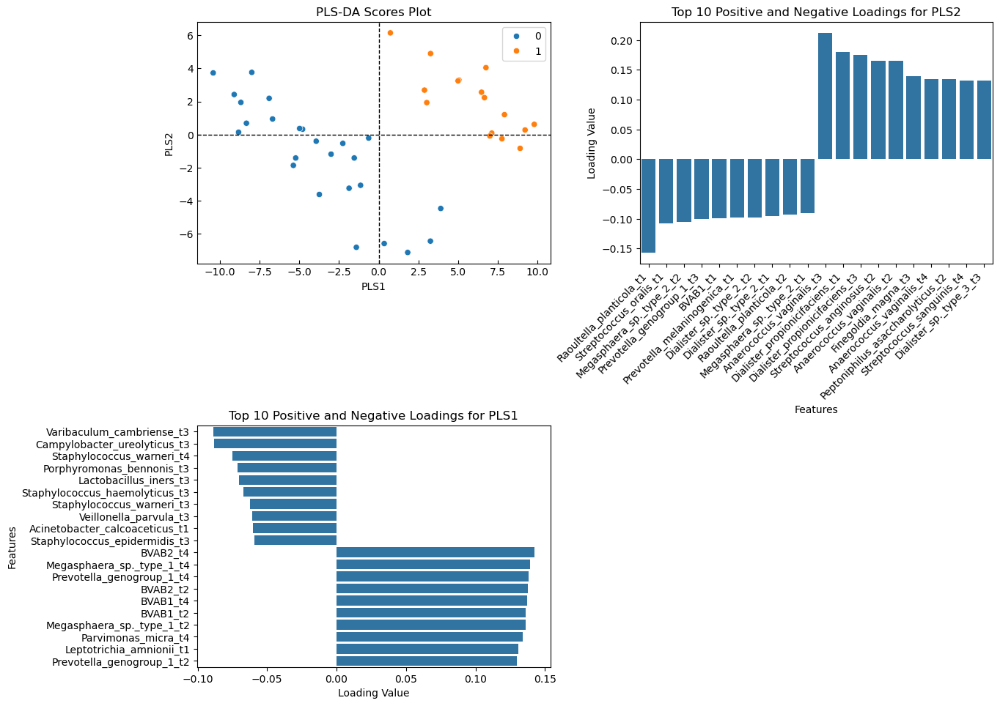

,accuracy,precision,recall,f1,specificity,mse,auc
Random Forest,0.68,0.62,0.63,0.61,0.72,0.32,0.57
Logistic Regression,0.61,0.46,0.59,0.50,0.64,0.39,0.50
Linear SVM,0.58,0.43,0.52,0.45,0.64,0.42,0.38
RBF SVM,0.58,0.48,0.64,0.53,0.56,0.42,0.58
K-Nearest Neighbors,0.54,0.34,0.37,0.35,0.64,0.46,0.40
Gradient Boosting,0.58,0.53,0.31,0.37,0.76,0.42,0.53
PLS-DA,0.68,0.60,0.63,0.60,0.72,0.32,0.69
Random Guess,0.61,0.00,0.00,0.00,1.00,0.39,0.70


In [3]:
df_3 = flatten(X_3)
#random_forest_model(df_4,y_4)
#RForest_top_features_plot(df_4,y_4,numb_features=15)
scores, loadings = plsda_scores_loading(df_3,y_3,numb_loadings=10, orthogonalize=True)
all_model_evaluation(df_3,y_3,test=True,n_splits=3)

In [4]:
#save for elastic net
matlab_ddm_save_data(df_3,y_3)

In [11]:
sum(y_3==1)

16

In [12]:
#Run with selected features using elastic net
import pandas as pd 
df = pd.read_csv('Data_Nugent_premenses_CST3/X_CST3_top_features.csv')
df = df.iloc[:,1:]
all_model_evaluation(df,y_3,test=True,n_splits=3)

,accuracy,precision,recall,f1,specificity,mse,auc
Random Forest,0.75,0.72,0.70,0.70,0.79,0.25,0.75
Logistic Regression,0.80,0.79,0.77,0.74,0.84,0.20,0.76
Linear SVM,0.75,0.76,0.71,0.67,0.80,0.25,0.77
RBF SVM,0.85,0.83,0.82,0.81,0.88,0.15,0.90
K-Nearest Neighbors,0.85,0.76,0.94,0.84,0.80,0.15,0.88
Gradient Boosting,0.73,0.64,0.68,0.66,0.75,0.27,0.66
PLS-DA,0.83,0.79,0.82,0.79,0.84,0.17,0.87
Random Guess,0.61,0.00,0.00,0.00,1.00,0.39,0.70


# April 9: CST IV

In [37]:
df['CST_HL'].value_counts(dropna=False)

CST_HL
4.0    1460
3.0    1070
1.0     869
2.0     539
5.0     114
Name: count, dtype: int64

In [38]:
df

,SERIAL,PID,MENSTRUATION,CST_HL,Lactobacillus_iners,Gardnerella_vaginalis,Lactobacillus_crispatus,Atopobium_vaginae,Lactobacillus_jensenii,Megasphaera_sp._type_1,...,Alloscardovia_omnicolens,Lactobacillus_helveticus,Actinomyces_urogenitalis,Peptostreptococcus_stomatis,Acinetobacter_calcoaceticus,Staphylococcus_warneri,Streptococcus_sanguinis,Bacteroides_uniformis,Aerococcus_viridans,NUGENT_CLASS
0,1.0,1,NaN,1.0,7.281386,2.397895,9.978734,2.639057,6.871091,1.609438,...,2.639057,6.236370,3.526361,0.693147,-23.025851,-23.025851,-23.025851,-23.025851,4.653960,NO_BV
1,2.0,1,NaN,1.0,8.708309,4.644391,11.451273,2.397895,8.434898,1.098612,...,4.262680,7.623642,1.945910,-23.025851,0.000000,-23.025851,0.000000,0.000000,0.000000,NO_BV
2,3.0,1,NaN,1.0,8.650850,5.575949,9.403684,0.000000,6.476972,0.693147,...,4.779123,6.063785,-23.025851,-23.025851,-23.025851,-23.025851,-23.025851,0.000000,2.708050,NO_BV
3,4.0,1,NaN,1.0,9.396156,5.236442,10.812250,5.141664,8.139149,2.944439,...,7.454141,7.063904,3.433987,0.693147,-23.025851,-23.025851,-23.025851,0.000000,0.000000,NO_BV
4,5.0,1,NaN,1.0,8.093768,2.197225,10.632798,1.945910,7.605392,1.098612,...,3.610918,6.951772,2.197225,4.510860,-23.025851,-23.025851,-23.025851,3.433987,4.948760,NO_BV
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4047,64.0,135,NaN,2.0,11.603799,6.232448,9.464517,3.850148,8.248267,2.079442,...,3.663562,7.876259,0.000000,0.000000,-23.025851,1.098612,0.000000,3.367296,-23.025851,INTER_BV
4048,65.0,135,NaN,2.0,6.025866,3.871201,5.117994,3.258097,2.890372,2.564949,...,-23.025851,3.433987,-23.025851,-23.025851,-23.025851,-23.025851,-23.025851,0.000000,-23.025851,NO_BV
4049,66.0,135,NaN,2.0,11.622139,6.492240,9.415238,4.812184,8.211754,3.091042,...,4.276666,7.866339,3.135494,1.386294,-23.025851,-23.025851,-23.025851,3.401197,-23.025851,NO_BV
4050,67.0,135,NaN,3.0,4.962845,3.970292,4.595120,2.079442,2.079442,2.197225,...,-23.025851,2.484907,-23.025851,-23.025851,-23.025851,-23.025851,-23.025851,-23.025851,-23.025851,NO_BV


In [65]:
import warnings
# Suppress all warnings globally
warnings.filterwarnings("ignore")
from QE_functions import *
df = df_abundance_nugent(filename=None, log=True, rel_abund=False, zscore=False,cst=True, metabolomics=False)
#X, y = menstruation_xblock_y_premensesX(df, menses_included=False,four_labels=False, multistability=False) #X=premenses data
#print(np.unique(y, return_counts=True))
#X, y = drop_blocks(X,y,thres=4)
#(X_1, y_1), (X_2, y_2), (X_3, y_3), (X_4, y_4), (X_5, y_5) = split_blocks_by_CST_most_frequent(X, y, equal_selection=False)


log transformed data


In [70]:
lst_y = [y_1,y_2,y_3,y_4,y_5]
for i in range(len(lst_y)):
    print('number of samples in CST{}: {}'.format(i+1,len(lst_y[i])))
    print('number of cases get BV post menses ',sum(lst_y[i]==1))

number of samples in CST1: 29
number of cases get BV post menses  1
number of samples in CST2: 20
number of cases get BV post menses  9
number of samples in CST3: 41
number of cases get BV post menses  16
number of samples in CST4: 43
number of cases get BV post menses  30
number of samples in CST5: 4
number of cases get BV post menses  0


In [54]:
# 5-folds CV on LSTM model for CST II, III, IV: 
lstm_model(X_2, y_2, padding_value=-10000, n_folds=3)

Training fold 1...
Epoch 1/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - accuracy: 0.3077 - loss: 1.6785 - val_accuracy: 0.5714 - val_loss: 0.5903
Epoch 2/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - accuracy: 1.0000 - loss: 0.2182 - val_accuracy: 0.7143 - val_loss: 0.5131
Epoch 3/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - accuracy: 0.7692 - loss: 0.2717 - val_accuracy: 0.8571 - val_loss: 0.4764
Epoch 4/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step - accuracy: 0.8462 - loss: 0.2389 - val_accuracy: 0.7143 - val_loss: 0.4409
Epoch 5/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - accuracy: 1.0000 - loss: 0.0559 - val_accuracy: 0.8571 - val_loss: 0.3994
Epoch 6/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step - accuracy: 0.8462 - loss: 0.2222 - val_accuracy: 0.7143 - val_loss: 0.4318
Epoch 7/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - accuracy: 1.0000 - loss: 0.0846 - val_accuracy: 0.8571 - val_loss: 0.3528
Epoch 8/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step - accuracy: 1.0000 - loss: 0.0236 - val_accuracy: 0.

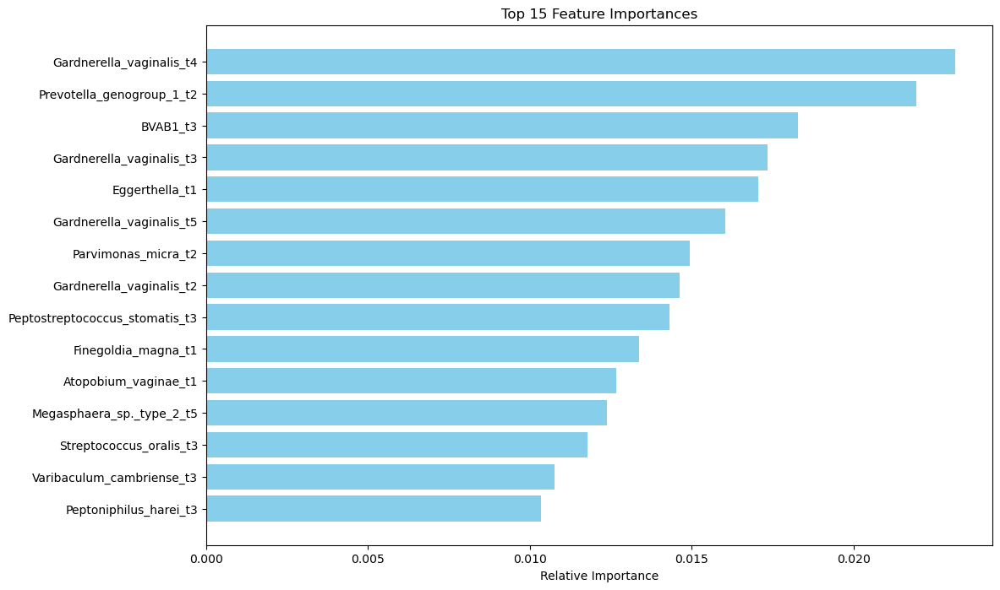

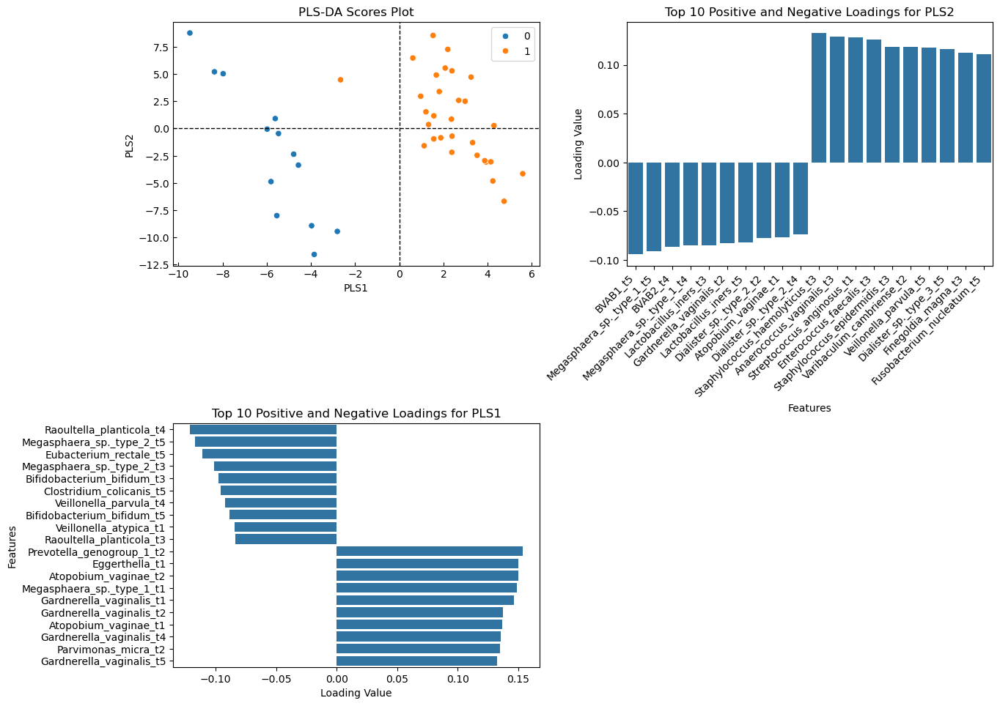

,accuracy,precision,recall,f1,specificity,mse,auc
Random Forest,0.72,0.75,0.90,0.81,0.32,0.28,0.88
Logistic Regression,0.65,0.72,0.83,0.77,0.25,0.35,0.83
Linear SVM,0.63,0.74,0.77,0.74,0.33,0.37,0.70
RBF SVM,0.65,0.70,0.87,0.77,0.17,0.35,0.61
K-Nearest Neighbors,0.65,0.68,0.93,0.79,0.00,0.35,0.75
Gradient Boosting,0.75,0.81,0.87,0.83,0.48,0.25,0.86
PLS-DA,0.60,0.71,0.73,0.72,0.32,0.40,0.83
Random Guess,0.70,0.70,1.00,0.82,0.00,0.30,0.85


In [60]:
df_4 = flatten(X_4)
#random_forest_model(df_4,y_4)
RForest_top_features_plot(df_4,y_4,numb_features=15)
scores, loadings = plsda_scores_loading(df_4,y_4,numb_loadings=10, orthogonalize=True)
all_model_evaluation(df_4,y_4,test=True,n_splits=3)

In [19]:
#save for elastic net
matlab_ddm_save_data(df_4,y_4)

In [20]:
sum(y_4==1)

30

In [57]:
#Run with selected features using elastic net
import pandas as pd 
df = pd.read_csv('Data_Nugent_premenses_CST2/X_CST2_top_features.csv')
df = df.iloc[:,1:]
all_model_evaluation(df,y_2,test=True,n_splits=3)

,accuracy,precision,recall,f1,specificity,mse,auc
Random Forest,0.80,0.83,0.89,0.82,0.75,0.20,0.95
Logistic Regression,1.00,1.00,1.00,1.00,1.00,0.00,1.00
Linear SVM,1.00,1.00,1.00,1.00,1.00,0.00,1.00
RBF SVM,1.00,1.00,1.00,1.00,1.00,0.00,1.00
K-Nearest Neighbors,0.95,0.92,1.00,0.95,0.92,0.05,1.00
Gradient Boosting,0.69,0.62,0.89,0.73,0.53,0.31,0.82
PLS-DA,1.00,1.00,1.00,1.00,1.00,0.00,1.00
Random Guess,0.55,0.00,0.00,0.00,1.00,0.45,0.73


# April 13: identify mono and multi-stability 

In [1]:
import warnings
# Suppress all warnings globally
warnings.filterwarnings("ignore")
from QE_functions import *
df = df_abundance_nugent(filename=None, log=True, rel_abund=False, zscore=False,cst=True, metabolomics=False)
X, y = menstruation_xblock_y_premensesX(df,menses_included=False,four_labels=False, multistability=True) #X=premenses data
print(np.unique(y, return_counts=True))
X, y = drop_blocks(X,y,thres=4)
(X_1, y_1), (X_2, y_2), (X_3, y_3), (X_4, y_4), (X_5, y_5) = split_blocks_by_CST_most_frequent(X, y, equal_selection=False)


log transformed data
Number of x_blocks (X): 205
Shape of labels (y): (205,)
(array([0, 1, 2]), array([122,  34,  49]))
Filtered number of x_blocks: 146
Filtered shape of labels (y): (146,)
Number of 1s: 26
Number of 0s: 87
Number of 2s: 33
Number of 3s: 0
length of X_1 and y_1:  29 29
length of X_2 and y_2:  20 20
length of X_3 and y_3:  41 41
length of X_4 and y_4:  43 43
length of X_5 and y_5:  4 4


In [4]:
lst_y = [y_1,y_2,y_3,y_4,y_5]
for i in range(len(lst_y)):
    print('number of samples in CST{}: {}'.format(i+1,len(lst_y[i])))
    print('number of cases didnot get BV post menses ',sum(lst_y[i]==0))
    print('number of cases had BV post menses on all days',sum(lst_y[i]==1))
    print('number of cases had BV post menses on some days',sum(lst_y[i]==2))

number of samples in CST1: 29
number of cases didnot get BV post menses  28
number of cases had BV post menses on all days 0
number of cases had BV post menses on some days 1
number of samples in CST2: 20
number of cases didnot get BV post menses  11
number of cases had BV post menses on all days 6
number of cases had BV post menses on some days 3
number of samples in CST3: 41
number of cases didnot get BV post menses  25
number of cases had BV post menses on all days 6
number of cases had BV post menses on some days 10
number of samples in CST4: 43
number of cases didnot get BV post menses  13
number of cases had BV post menses on all days 13
number of cases had BV post menses on some days 17
number of samples in CST5: 4
number of cases didnot get BV post menses  4
number of cases had BV post menses on all days 0
number of cases had BV post menses on some days 0


# BMES 2025: Kelly asked PLSDA figures for CST-III in HMP dataset 

In [95]:
filename = '/Users/bonakdar/Desktop/Arnold Lab/QE/HMP/HMP_ALL_DATA_Release2_with_METABOLOMICS_ALL_12172017.xlsx'
# Load your DataFrame
df = pd.read_excel(filename)

In [96]:
df['PID'].value_counts()

PID
81     77
78     76
103    72
17     72
16     72
       ..
24     40
33     35
32     35
67     27
80     18
Name: count, Length: 130, dtype: int64

In [5]:
import warnings
# Suppress all warnings globally
warnings.filterwarnings("ignore")
from QE_functions import *
df = df_abundance_nugent(filename=None, log=True, rel_abund=False, zscore=False,cst=True, metabolomics=False)
X, y = menstruation_xblock_y_premensesX(df,menses_included=False,four_labels=False, multistability=False) #X=premenses data
print(np.unique(y, return_counts=True))
X, y = drop_blocks(X,y,thres=4)
(X_1, y_1), (X_2, y_2), (X_3, y_3), (X_4, y_4), (X_5, y_5) = split_blocks_by_CST_most_frequent(X, y, equal_selection=False)


log transformed data
Number of x_blocks (X): 205
Shape of labels (y): (205,)
(array([0, 1]), array([122,  83]))
Filtered number of x_blocks: 146
Filtered shape of labels (y): (146,)
Number of 1s: 59
Number of 0s: 87
length of X_1 and y_1:  29 29
length of X_2 and y_2:  20 20
length of X_3 and y_3:  41 41
length of X_4 and y_4:  43 43
length of X_5 and y_5:  4 4


In [6]:
lst_y = [y_1,y_2,y_3,y_4,y_5]
for i in range(len(lst_y)):
    print('number of samples in CST{}: {}'.format(i+1,len(lst_y[i])))
    print('number of cases didnot get BV post menses ',sum(lst_y[i]==0))
    print('number of cases had BV post menses',sum(lst_y[i]==1))
    

number of samples in CST1: 29
number of cases didnot get BV post menses  28
number of cases had BV post menses 1
number of samples in CST2: 20
number of cases didnot get BV post menses  11
number of cases had BV post menses 9
number of samples in CST3: 41
number of cases didnot get BV post menses  25
number of cases had BV post menses 16
number of samples in CST4: 43
number of cases didnot get BV post menses  13
number of cases had BV post menses 30
number of samples in CST5: 4
number of cases didnot get BV post menses  4
number of cases had BV post menses 0


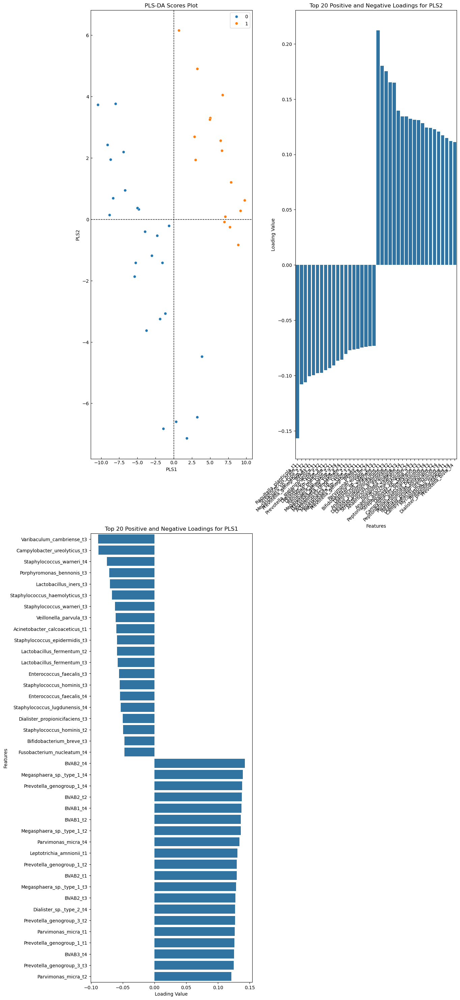

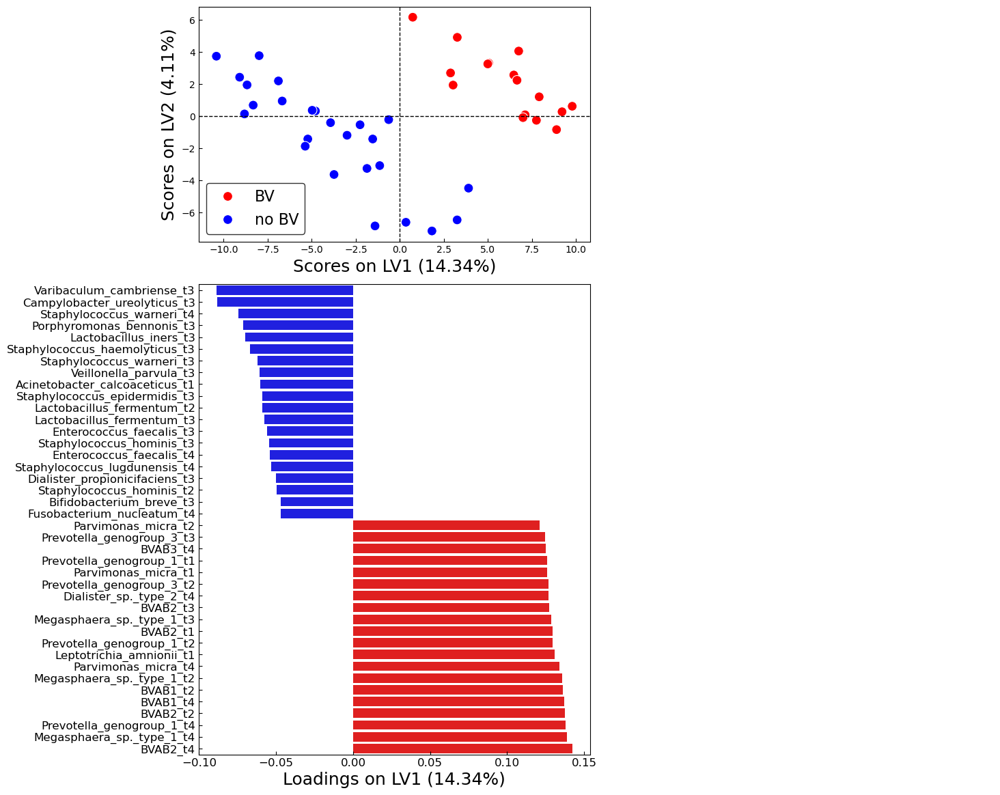

In [4]:
df_3 = flatten(X_3)
#random_forest_model(df_4,y_4)
#RForest_top_features_plot(df_3,y_3,numb_features=15)
scores, loadings = plsda_scores_loading(df_3,y_3,numb_loadings=20, orthogonalize=True)
PLSDA_plots(df_3, y_3, num_components=2, orthogonalize=True, num_loadings=20, LV1=True, LV2=False)
#all_model_evaluation(df_3,y_3,test=True,n_splits=3)

In [82]:
# Using list comprehension to identify columns containing "BVAB" and drop them
columns_to_drop = [col for col in df_3.columns if 'BVAB' in col]
columns_to_drop
# Drop the identified columns
df_3 = df_3.drop(columns=columns_to_drop)

# April 30: Meeting with Jaq 

Get the prediction on whole HMP data

In [1]:
import warnings
# Suppress all warnings globally
warnings.filterwarnings("ignore")
from QE_functions import *
df = df_abundance_nugent(filename=None, log=True, rel_abund=False, zscore=False,cst=False, metabolomics=False)
X, y = menstruation_xblock_y_premensesX(df,menses_included=False,four_labels=False, multistability=False) #X=premenses data
print(np.unique(y, return_counts=True))
X, y = drop_blocks(X,y,thres=4)

log transformed data
Number of x_blocks (X): 239
Shape of labels (y): (239,)
(array([0, 1]), array([141,  98]))
Filtered number of x_blocks: 171
Filtered shape of labels (y): (171,)
Number of 1s: 69
Number of 0s: 102


In [2]:
df_whole = flatten(X)
all_model_evaluation(df_whole,y,test=True,n_splits=5)

,accuracy,precision,recall,f1,specificity,mse,auc
Random Forest,0.81,0.81,0.71,0.74,0.87,0.19,0.79
Logistic Regression,0.74,0.69,0.68,0.68,0.78,0.26,0.72
Linear SVM,0.70,0.64,0.64,0.63,0.74,0.30,0.70
RBF SVM,0.82,0.76,0.84,0.79,0.82,0.18,0.81
K-Nearest Neighbors,0.82,0.81,0.73,0.76,0.88,0.18,0.74
Gradient Boosting,0.78,0.73,0.75,0.73,0.81,0.22,0.76
PLS-DA,0.82,0.80,0.75,0.78,0.87,0.18,0.80
Random Guess,0.60,0.00,0.00,0.00,1.00,0.40,0.70


In [4]:
# 5-folds CV on LSTM model for CST II, III, IV: 
lstm_model(X, y, padding_value=-10000, n_folds=5)

Training fold 1...
Epoch 1/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 189ms/step - accuracy: 0.5839 - loss: 1.0109 - val_accuracy: 0.7143 - val_loss: 0.6395
Epoch 2/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - accuracy: 0.7614 - loss: 0.5231 - val_accuracy: 0.7429 - val_loss: 0.6204
Epoch 3/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - accuracy: 0.7708 - loss: 0.5800 - val_accuracy: 0.7714 - val_loss: 0.5905
Epoch 4/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - accuracy: 0.8344 - loss: 0.4882 - val_accuracy: 0.7714 - val_loss: 0.6392
Epoch 5/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - accuracy: 0.8689 - loss: 0.4319 - val_accuracy: 0.7714 - val_loss: 0.6802
Epoch 6/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 138ms/step - accuracy: 0.8909 - loss: 0.2769 - val_accuracy: 0.8286 - val_loss: 0.6264
Epoch 7/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 148ms/step - accuracy: 0.8499 - loss: 0.4040 - val_accuracy: 0.8571 - val_loss: 0.5940
Epoch 8/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 147ms/step - accuracy: 0.9077 - loss: 0.2464 - val_accuracy:

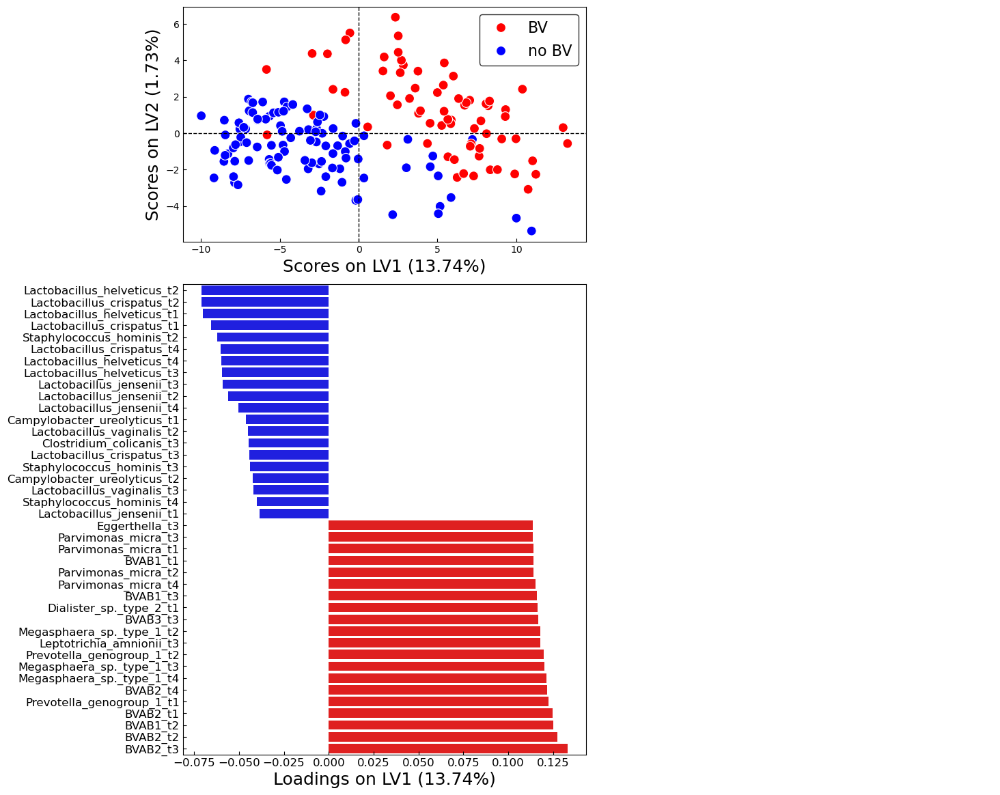

In [5]:
PLSDA_plots(df_whole, y, num_components=2, orthogonalize=True, num_loadings=20, LV1=True, LV2=False)

In [27]:
import warnings
# Suppress all warnings globally
warnings.filterwarnings("ignore")
from QE_functions import *
df = df_abundance_nugent(filename=None, log=True, rel_abund=False, zscore=False,cst=True, metabolomics=False)
X, y = menstruation_xblock_y_premensesX(df,menses_included=False,four_labels=False, multistability=False) #X=premenses data
print(np.unique(y, return_counts=True))
X, y = drop_blocks(X,y,thres=4)
(X_1, y_1), (X_2, y_2), (X_3, y_3), (X_4, y_4), (X_5, y_5) = split_blocks_by_CST_most_frequent(X, y, equal_selection=False)
#df_4 = flatten(X_4)
#random_forest_model(df_4,y_4)
#RForest_top_features_plot(df_3,y_3,numb_features=15)
#scores, loadings = plsda_scores_loading(df_3,y_3,numb_loadings=20, orthogonalize=True)
#PLSDA_plots(df_4, y_4, num_components=2, orthogonalize=True, num_loadings=20, LV1=True, LV2=False)
#all_model_evaluation(df_3,y_3,test=True,n_splits=3)

log transformed data
Number of x_blocks (X): 205
Shape of labels (y): (205,)
(array([0, 1]), array([122,  83]))
Filtered number of x_blocks: 146
Filtered shape of labels (y): (146,)
Number of 1s: 59
Number of 0s: 87
length of X_1 and y_1:  29 29
length of X_2 and y_2:  20 20
length of X_3 and y_3:  41 41
length of X_4 and y_4:  43 43
length of X_5 and y_5:  4 4


In [21]:
sum(y_4==0)

13

In [26]:
import sklearn
print(sklearn.__version__)

1.6.1


In [1]:
import warnings
# Suppress all warnings globally
warnings.filterwarnings("ignore")
from QE_functions import *
df = df_abundance_nugent(filename=None, log=True, rel_abund=False, zscore=False,cst=True, metabolomics=True)
df

log transformed data


,SERIAL,PID,Metabolomics,MENSTRUATION,CST_HL,Lactobacillus_iners,Gardnerella_vaginalis,Lactobacillus_crispatus,Atopobium_vaginae,Lactobacillus_jensenii,...,Alloscardovia_omnicolens,Lactobacillus_helveticus,Actinomyces_urogenitalis,Peptostreptococcus_stomatis,Acinetobacter_calcoaceticus,Staphylococcus_warneri,Streptococcus_sanguinis,Bacteroides_uniformis,Aerococcus_viridans,NUGENT_CLASS
0,1.0,1,0,NaN,1.0,7.281386,2.397895,9.978734,2.639057,6.871091,...,2.639057,6.236370,3.526361,0.693147,-23.025851,-23.025851,-23.025851,-23.025851,4.653960,NO_BV
1,2.0,1,0,NaN,1.0,8.708309,4.644391,11.451273,2.397895,8.434898,...,4.262680,7.623642,1.945910,-23.025851,0.000000,-23.025851,0.000000,0.000000,0.000000,NO_BV
2,3.0,1,0,NaN,1.0,8.650850,5.575949,9.403684,0.000000,6.476972,...,4.779123,6.063785,-23.025851,-23.025851,-23.025851,-23.025851,-23.025851,0.000000,2.708050,NO_BV
3,4.0,1,0,NaN,1.0,9.396156,5.236442,10.812250,5.141664,8.139149,...,7.454141,7.063904,3.433987,0.693147,-23.025851,-23.025851,-23.025851,0.000000,0.000000,NO_BV
4,5.0,1,0,NaN,1.0,8.093768,2.197225,10.632798,1.945910,7.605392,...,3.610918,6.951772,2.197225,4.510860,-23.025851,-23.025851,-23.025851,3.433987,4.948760,NO_BV
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4047,64.0,135,0,NaN,2.0,11.603799,6.232448,9.464517,3.850148,8.248267,...,3.663562,7.876259,0.000000,0.000000,-23.025851,1.098612,0.000000,3.367296,-23.025851,INTER_BV
4048,65.0,135,0,NaN,2.0,6.025866,3.871201,5.117994,3.258097,2.890372,...,-23.025851,3.433987,-23.025851,-23.025851,-23.025851,-23.025851,-23.025851,0.000000,-23.025851,NO_BV
4049,66.0,135,0,NaN,2.0,11.622139,6.492240,9.415238,4.812184,8.211754,...,4.276666,7.866339,3.135494,1.386294,-23.025851,-23.025851,-23.025851,3.401197,-23.025851,NO_BV
4050,67.0,135,0,NaN,3.0,4.962845,3.970292,4.595120,2.079442,2.079442,...,-23.025851,2.484907,-23.025851,-23.025851,-23.025851,-23.025851,-23.025851,-23.025851,-23.025851,NO_BV


In [2]:
sum(df['Metabolomics']==1)

313

In [3]:
def df_sina_nugent(filename=None, log=False, rel_abund=False, zscore=False, cst=False, metabolomics=False): 
    """
    Sina Bonakdar March, 2025
    Load data from a specified Excel file into a pandas DataFrame.
    Uses a default file path if no filename is provided.

    Parameters:
    filename (str): The path to the Excel file.
    log=True: perform natural log transformation
    rel_abund=True: perform relative abundance data
    zscore=True: preprocess of relative abundance using zscore
    cst=True: Will record CST-I,II,III,IV,V as a column as well
    metabolomics=True: include the column of metabolic data (important to know how many days for each block we will have metabolic data

    Returns:
    Cleaned dataframe with 4751 rows and 83 columns 
    including bacterial data + NUGENT Class for each timepoint and sample. 
    """
    import pandas as pd 
    from sklearn import preprocessing
    import numpy as np
    if not filename:
        filename = '/Users/bonakdar/Desktop/Arnold Lab/QE/HMP/HMP_ALL_DATA_Release2_with_METABOLOMICS_ALL_12172017.xlsx'
    # Load your DataFrame
    df = pd.read_excel(filename)
    #drop the samples with mensturation for all time points 
    #values_to_drop = [4, 19, 63, 79]
    #df = df[~df['PID'].isin(values_to_drop)]
    # Determine the indices of columns to drop
    cols_to_drop = list((0,1,3,14))
    if metabolomics==True:
        cols_to_drop += list(range(5, 8))
        cols_to_drop += list(range(9, 13))
    else:
        cols_to_drop += list(range(5, 13))
    if cst==True:
        cols_to_drop += list(range(16, 145))
    else:
        cols_to_drop += list(range(16, 146))
    cols_to_drop += list(range(-8, 0))
    df.drop(df.columns[cols_to_drop], axis=1, inplace=True)
    #Take the label column named (NUGENT_CLASS) to the end: 
    column_to_move = 'NUGENT_CLASS'
    columns = list(df.columns)
    columns.append(columns.pop(columns.index(column_to_move)))
    df = df[columns]
    #drop the columns with more than 3800 nan values: different number of rows will be dropped by including vs. not including CSTs
    nan_counts = df.isna().sum() 
    cols_to_drop = nan_counts[nan_counts >= 3800].index
    if cst==True:
        df.drop(columns=cols_to_drop[2:], inplace=True) #drop all columns except menstruation 
    else:
        df.drop(columns=cols_to_drop[1:], inplace=True)
    #drop rows with nan values
    ignore_columns = ['PID', 'MENSTRUATION', 'SERIAL']
    #df = df.dropna(subset=[col for col in df.columns if col not in ignore_columns])
    df.reset_index(drop=True, inplace=True)
    if cst==True and metabolomics==True:
        bacteria_columns = df.columns[5:-1]
    elif cst==True and metabolomics==False:
        bacteria_columns = df.columns[4:-1]
    elif cst==False and metabolomics==True:
        bacteria_columns = df.columns[4:-1]
    elif cst==False and metabolomics==False:
        bacteria_columns = df.columns[3:-1]
    if log==True:
        #perform log transformation
        small_number = 1e-10
        df[bacteria_columns] = df[bacteria_columns].replace(0, small_number)
        df[bacteria_columns] = np.log(df[bacteria_columns])
        print('log transformed data')
        return df   
    if rel_abund==True:
        #create relative abundance data 
        row_sums = df[bacteria_columns].sum(axis=1) # Calculate the sum of the relevant columns for each row
        df[bacteria_columns] = df[bacteria_columns].div(row_sums, axis=0)
        if zscore==True:
        #preprocessing of df: standardize the data for each row. Makes each sample to have zero mean and 1 std. Known as zscore  normalization 
            for col in bacteria_columns:
                df[col] = preprocessing.scale(df[col].values)  # Scale the data to make it between 0-1.
            print('relative abundance + zscore data')
            return df
        else:
            print('relative abundance data')
            return df      
    else:
        print('either log, rel_abund, or zscore has to be True. This is original data')
        return df
        

In [5]:
df = df_sina_nugent(filename=None, log=False, rel_abund=False, zscore=False, cst=False, metabolomics=True)
df

either log, rel_abund, or zscore has to be True. This is original data


,SERIAL,PID,Metabolomics,MENSTRUATION,NUGENT_CLASS
0,1.0,1,0,NaN,NO_BV
1,2.0,1,0,NaN,NO_BV
2,3.0,1,0,NaN,NO_BV
3,4.0,1,0,NaN,NO_BV
4,5.0,1,0,NaN,NO_BV
...,...,...,...,...,...
8891,67.0,135,0,NaN,NO_BV
8892,68.0,135,0,NaN,NO_BV
8893,69.0,135,0,NaN,NO_BV
8894,70.0,135,0,NaN,NaN


In [6]:
sum(df['Metabolomics']==1)

500